# Data preprocessing and profiling

In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [7]:
data = pd.read_csv("adult.csv")
print(data.info())
data.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32561 entries, 0 to 32560
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   age             32561 non-null  int64 
 1   workclass       32561 non-null  object
 2   fnlwgt          32561 non-null  int64 
 3   education       32561 non-null  object
 4   education.num   32561 non-null  int64 
 5   marital.status  32561 non-null  object
 6   occupation      32561 non-null  object
 7   relationship    32561 non-null  object
 8   race            32561 non-null  object
 9   sex             32561 non-null  object
 10  capital.gain    32561 non-null  int64 
 11  capital.loss    32561 non-null  int64 
 12  hours.per.week  32561 non-null  int64 
 13  native.country  32561 non-null  object
 14  income          32561 non-null  object
dtypes: int64(6), object(9)
memory usage: 3.7+ MB
None


,age,workclass,fnlwgt,education,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
0,90,?,77053,HS-grad,9,Widowed,?,Not-in-family,White,Female,0,4356,40,United-States,<=50K
1,82,Private,132870,HS-grad,9,Widowed,Exec-managerial,Not-in-family,White,Female,0,4356,18,United-States,<=50K
2,66,?,186061,Some-college,10,Widowed,?,Unmarried,Black,Female,0,4356,40,United-States,<=50K
3,54,Private,140359,7th-8th,4,Divorced,Machine-op-inspct,Unmarried,White,Female,0,3900,40,United-States,<=50K
4,41,Private,264663,Some-college,10,Separated,Prof-specialty,Own-child,White,Female,0,3900,40,United-States,<=50K


In [8]:
from ydata_profiling import ProfileReport

# Generate the Report
profile = ProfileReport(data,title="Adult Census Profile")

In [9]:
profile

Render HTML: 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


## As we can observe, we have some dataset issues, like missing values, imbalance, zeros and duplicates

In [10]:
# Remove rows with null values
data_cleaned = data.dropna()

# Remove rows with "?" values
data_cleaned = data_cleaned[(data_cleaned != '?').all(axis=1)]

In [11]:
data_filtered = data_cleaned.drop(columns=['fnlwgt', 'education','capital.gain','capital.loss'])

In [12]:
# See unique values for each categorical class
categorical_columns = data_filtered.select_dtypes(include=['object']).columns
for column in categorical_columns:
    print(f"Column: {column}")
    print(data_filtered[column].value_counts())
    print("-" * 50)  # Separator for readability

Column: workclass
workclass
Private             22286
Self-emp-not-inc     2499
Local-gov            2067
State-gov            1279
Self-emp-inc         1074
Federal-gov           943
Without-pay            14
Name: count, dtype: int64
--------------------------------------------------
Column: marital.status
marital.status
Married-civ-spouse       14065
Never-married             9726
Divorced                  4214
Separated                  939
Widowed                    827
Married-spouse-absent      370
Married-AF-spouse           21
Name: count, dtype: int64
--------------------------------------------------
Column: occupation
occupation
Prof-specialty       4038
Craft-repair         4030
Exec-managerial      3992
Adm-clerical         3721
Sales                3584
Other-service        3212
Machine-op-inspct    1966
Transport-moving     1572
Handlers-cleaners    1350
Farming-fishing       989
Tech-support          912
Protective-serv       644
Priv-house-serv       143
Armed-Forces 

## Maping country to region, creating a new column

In [13]:
country_to_region = {
    'United-States': 'United States',
    'Mexico': 'Latin America',
    'Canada': 'United States',
    'El-Salvador': 'Latin America',
    'Guatemala': 'Latin America',
    'Cuba': 'Latin America',
    'Dominican-Republic': 'Latin America',
    'Trinadad&Tobago': 'Latin America',
    'Puerto-Rico': 'Latin America',
    'Jamaica': 'Latin America',
    'Honduras': 'Latin America',
    'Philippines': 'Asia',
    'India': 'Asia',
    'China': 'Asia',
    'Vietnam': 'Asia',
    'Japan': 'Asia',
    'Iran': 'Asia',
    'Taiwan': 'Asia',
    'Cambodia': 'Asia',
    'Thailand': 'Asia',
    'Laos': 'Asia',
    'Hong': 'Asia',
    'England': 'Europe',
    'Germany': 'Europe',
    'Italy': 'Europe',
    'France': 'Europe',
    'Ireland': 'Europe',
    'Poland': 'Europe',
    'Portugal': 'Europe',
    'Greece': 'Europe',
    'Scotland': 'Europe',
    'Yugoslavia': 'Europe',
    'Hungary': 'Europe',
    'Ecuador': 'Latin America',
    'Columbia': 'Latin America',
    'Peru': 'Latin America',
    'Nicaragua': 'Latin America',
    'Haiti': 'Other',
    'South': 'Other',
    'Holand-Netherlands': 'Europe',
    'Outlying-US(Guam-USVI-etc)': 'Other',
}

# Map the countries to regions
data_filtered['region'] = data_filtered['native.country'].map(country_to_region)

# Handle any remaining unmapped values
data_filtered['region'] = data_filtered['region'].fillna('Other')

# Check the new grouped column
print(data_filtered['region'].value_counts())


region
United States    27611
Latin America     1297
Asia               634
Europe             493
Other              127
Name: count, dtype: int64


In [14]:
data_filtered = data_filtered.drop(columns=["native.country"])

In [15]:
# Let's also transform the race 'Amer-Indian-Eskimo' into 'Other'
data_filtered['race'] = data_filtered['race'].replace({'Amer-Indian-Eskimo': 'Other'})


Race Distribution:
 race
White                 25933
Black                  2817
Asian-Pac-Islander      895
Other                   517
Name: count, dtype: int64

Sex Distribution:
 sex
Male      20380
Female     9782
Name: count, dtype: int64

Region Distribution:
 region
United States    27611
Latin America     1297
Asia               634
Europe             493
Other              127
Name: count, dtype: int64


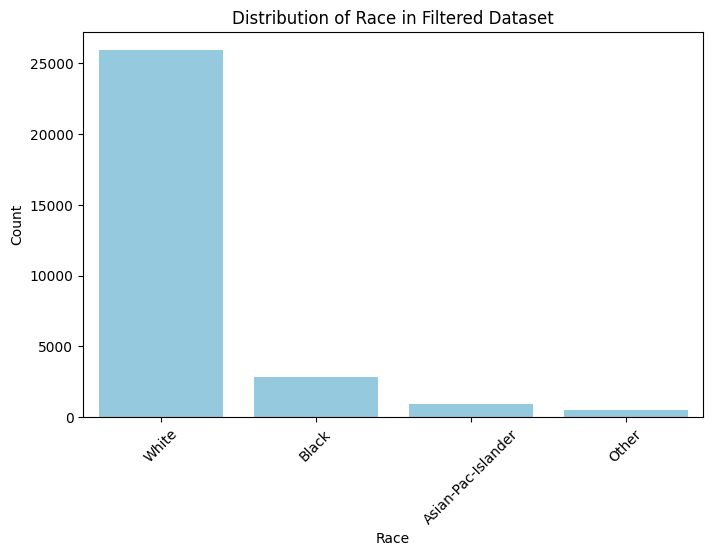

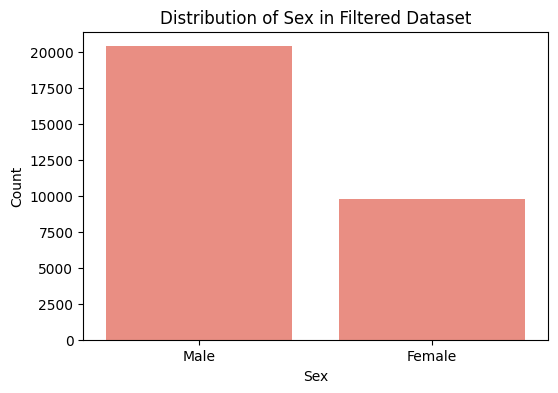

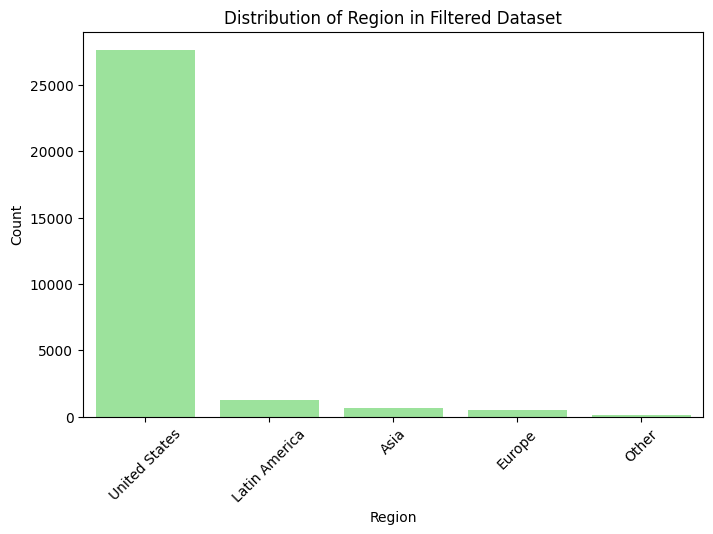

In [16]:
#import matplotlib
#import matplotlib.pyplot as plt
%matplotlib inline

# Analyze the 'race' column distribution
if 'race' in data_filtered.columns:
    race = data_filtered['race']
    race_distribution = race.value_counts()
    print("\nRace Distribution:\n", race_distribution)
else:
    print("\nThe 'race' column is not present. Available columns are:\n", data_filtered.columns)

# Analyze the 'sex' column distribution
if 'sex' in data_filtered.columns:
    sex = data_filtered['sex']
    sex_distribution = sex.value_counts()
    print("\nSex Distribution:\n", sex_distribution)
else:
    print("\nThe 'sex' column is not present. Available columns are:\n", data_filtered.columns)

# Analyze the 'region' column distribution
if 'region' in data_filtered.columns:
    region = data_filtered['region']
    region_distribution = region.value_counts()
    print("\nRegion Distribution:\n", region_distribution)
else:
    print("\nThe 'region' column is not present. Available columns are:\n", data_filtered.columns)

# Visualize Race Distribution
if 'race' in data_filtered.columns:
    plt.figure(figsize=(8, 5))
    sns.barplot(x=race_distribution.index, y=race_distribution.values, color="skyblue")  # Single color
    plt.title('Distribution of Race in Filtered Dataset')
    plt.xlabel('Race')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.show()

# Visualize Sex Distribution
if 'sex' in data_filtered.columns:
    plt.figure(figsize=(6, 4))
    sns.barplot(x=sex_distribution.index, y=sex_distribution.values, color="salmon")  # Single color
    plt.title('Distribution of Sex in Filtered Dataset')
    plt.xlabel('Sex')
    plt.ylabel('Count')
    plt.show()

# Visualize Region Distribution
if 'region' in data_filtered.columns:
    plt.figure(figsize=(8, 5))
    sns.barplot(x=region_distribution.index, y=region_distribution.values, color="lightgreen")  # Single color
    plt.title('Distribution of Region in Filtered Dataset')
    plt.xlabel('Region')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.show()


In [17]:
data_filtered.to_csv('adult_preprocessed.csv', index=False)

# Fairness analysis and mitigation
# First approach

In [128]:
import pandas as pd
data_filtered = pd.read_csv("adult_preprocessed.csv")

In [2]:
data_filtered.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30162 entries, 0 to 30161
Data columns (total 11 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   age             30162 non-null  int64 
 1   workclass       30162 non-null  object
 2   education.num   30162 non-null  int64 
 3   marital.status  30162 non-null  object
 4   occupation      30162 non-null  object
 5   relationship    30162 non-null  object
 6   race            30162 non-null  object
 7   sex             30162 non-null  object
 8   hours.per.week  30162 non-null  int64 
 9   income          30162 non-null  object
 10  region          30162 non-null  object
dtypes: int64(3), object(8)
memory usage: 2.5+ MB


## Fairness pipeline using *fairlearn*

In [40]:
import pandas as pd
from sklearn.compose import make_column_transformer, make_column_selector
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn import set_config
import torch
from math import sqrt
from fairlearn.metrics import MetricFrame, demographic_parity_difference
from sklearn.metrics import accuracy_score
from numpy import mean
from fairlearn.adversarial import AdversarialFairnessClassifier
from fairlearn.datasets import fetch_adult
from fairlearn.metrics import MetricFrame, selection_rate

def run_fairness_pipeline(dataset, sensitive_feature,schedulers=[]):
    """
    Runs the fairness pipeline for a given dataset and sensitive feature.

    Parameters:
    - dataset: DataFrame containing the dataset.
    - sensitive_feature: str, name of the sensitive feature column (e.g., 'sex', 'region', 'race').
    - target_column: str, name of the target column. Default is 'income'.
    """

    # Split features and target
    X = dataset.drop(columns=["income"])  # Replace "income" with your target column name
    y = dataset["income"]
    z = X[sensitive_feature]  # Set the sensitive feature

    # Train-test split
    X_train, X_test, y_train, y_test, Z_train, Z_test = train_test_split(
        X, y, z, test_size=0.2, random_state=12345, stratify=y
    )

    # Enable sklearn metadata routing
    set_config(enable_metadata_routing=True)

    # Define column transformers
    ct = make_column_transformer(
        (
            Pipeline(
                [
                    ("imputer", SimpleImputer(strategy="mean")),
                    ("normalizer", StandardScaler()),
                ]
            ),
            make_column_selector(dtype_include="number"),
        ),
        (
            Pipeline(
                [
                    ("imputer", SimpleImputer(strategy="most_frequent")),
                    ("encoder", OneHotEncoder(drop="if_binary", sparse_output=False)),
                ]
            ),
            make_column_selector(dtype_include="category"),
        ),
    )

    X_train_transformed = ct.fit_transform(X_train)
    in_features = X_train_transformed.shape[1]

    # Define Predictor Model
    class PredictorModel(torch.nn.Module):
        def __init__(self, in_features):
            super(PredictorModel, self).__init__()
            self.layers = torch.nn.Sequential(
                torch.nn.Linear(in_features=in_features, out_features=200),
                torch.nn.LeakyReLU(),
                torch.nn.Linear(in_features=200, out_features=1),
                torch.nn.Sigmoid(),
            )

        def forward(self, x):
            return self.layers(x)

    predictor_model = PredictorModel(in_features=in_features)

    def validate(pipeline, X, y, z, pos_label):
        predictions = pipeline.predict(X)
        dp_diff = demographic_parity_difference(
            y == pos_label,
            predictions == pos_label,
            sensitive_features=z,
        )
        accuracy = mean(predictions == y.values)
        selection_rate = mean(predictions == pos_label)
        print(
            f"Sensitive Feature: {sensitive_feature}, DP diff: {dp_diff:.4f}, accuracy: {accuracy:.4f}, selection_rate: {selection_rate:.4f}"
        )
        return dp_diff, accuracy, selection_rate

    schedulers = []

    def optimizer_constructor(model):
        #global schedulers
        optimizer = torch.optim.Adam(model.parameters(), lr=0.01)
        schedulers.append(torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=0.995))
        return optimizer

    def callbacks(model, step, X, y, z, pos_label):
        #global schedulers
        model.alpha = 0.3 * sqrt(step // 1)
        for scheduler in schedulers:
            scheduler.step()
        if step % 50 == 0:
            dp_diff, accuracy, selection_rate = validate(model, X, y, z, pos_label)
            if dp_diff < 0.03 and accuracy > 0.8 and 0.01 < selection_rate < 0.99:
                return True

    mitigator = AdversarialFairnessClassifier(
        predictor_model=predictor_model,
        adversary_model=[3, "leaky_relu"],
        predictor_optimizer=optimizer_constructor,
        adversary_optimizer=optimizer_constructor,
        epochs=10,
        batch_size=2**7,
        shuffle=True,
        callbacks=callbacks,
        random_state=123,
    )

    pipeline = make_pipeline(ct, mitigator.set_fit_request(sensitive_features=True))
    pipeline.fit(X_train, y_train, sensitive_features=Z_train)

    # Define the positive label for validation
    _, labelget = fetch_adult(return_X_y=True)
    pos_label = labelget[2]  # positive = >50k
    print("positive label:", pos_label)
    z = X[sensitive_feature]  # In this example, we consider 'sex' the sensitive feature.
    # to see DP difference, accuracy, and selection_rate
    print(validate(pipeline, X_test, y_test, z=Z_test, pos_label=pos_label))
    # Validate the pipeline
    validate(pipeline, X_test, y_test, z=Z_test, pos_label=pos_label)

    # Predictions and metrics
    predictions = pipeline.predict(X_test)
    mf = MetricFrame(
        metrics={"accuracy": accuracy_score, "selection_rate": selection_rate},
        y_true=y_test == pos_label,
        y_pred=predictions == pos_label,
        sensitive_features=Z_test,
    )
    print(mf.by_group)

    set_config(enable_metadata_routing=False)

### First let's analyze the fairlearn metrics and evaluations for the sensitive features *sex*, *region*, and *race*

In [24]:
run_fairness_pipeline(data_filtered, sensitive_feature="sex")

Sensitive Feature: sex, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: sex, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: sex, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: sex, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: sex, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: sex, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: sex, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: sex, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: sex, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: sex, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: sex, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: sex, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Featur

In [26]:
# For 'race' as the sensitive feature
run_fairness_pipeline(data_filtered, sensitive_feature="race")

Sensitive Feature: race, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: race, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: race, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: race, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: race, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: race, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: race, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: race, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: race, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: race, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: race, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: race, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sens

In [96]:
# For 'region' as the sensitive feature
run_fairness_pipeline(data_filtered, sensitive_feature="region")


Sensitive Feature: region, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: region, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: region, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: region, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: region, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: region, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: region, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: region, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: region, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: region, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: region, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: region, DP diff: 0.0000, accuracy: 0.0000, sel

## From the analysis of DP diff and selection rate, we observe that:
- For the sensitive feature "race", "Black" and "Other" groups are experiencing bias compared to other groups.
- In "sex", men have almost double the selection rate compared to women, favoring the male gender.
- In "region", the DP diff is significantly higher (0.249), indicating low fairness.
- Although "Latin America" has a higher selection rate, it also shows very low accuracy (0.55), indicating less reliable predictions.

## Let's try augmenting data
Our goal here is to fight against class imbalance to have better prediction models and increase fairness

### First procedure:
#### Let's try balancing all sensitive features to have the same row count for each value.

In [28]:
import pandas as pd

# Check if the necessary columns exist
if 'region' in data_filtered.columns and 'race' in data_filtered.columns:
    # Group by 'region' and 'race', then count occurrences
    region_race_counts = data_filtered.groupby(['region', 'race']).size().reset_index(name='count')

    # Calculate the total occurrences for each region
    region_totals = data_filtered['region'].value_counts().reset_index()
    region_totals.columns = ['region', 'total']

    # Merge the total counts back into the grouped data
    region_race_counts = region_race_counts.merge(region_totals, on='region')

    # Calculate the percentage of each 'race' within each 'region'
    region_race_counts['percentage'] = (region_race_counts['count'] / region_race_counts['total']) * 100

    # Sort and display the results
    region_race_counts = region_race_counts.sort_values(by=['region', 'percentage'], ascending=[True, False])
    print(region_race_counts)

else:
    print("The required columns 'region' and 'race' are not present in the dataset.")


           region                race  count  total  percentage
0            Asia  Asian-Pac-Islander    540    634   85.173502
3            Asia               White     78    634   12.302839
2            Asia               Other     10    634    1.577287
1            Asia               Black      6    634    0.946372
7          Europe               White    470    493   95.334686
5          Europe               Black     14    493    2.839757
4          Europe  Asian-Pac-Islander      7    493    1.419878
6          Europe               Other      2    493    0.405680
11  Latin America               White   1053   1297   81.187355
9   Latin America               Black    121   1297    9.329221
10  Latin America               Other    118   1297    9.097918
8   Latin America  Asian-Pac-Islander      5   1297    0.385505
12          Other  Asian-Pac-Islander     69    127   54.330709
13          Other               Black     47    127   37.007874
15          Other               White   

## Let's use SDV, which is a tool that creates synthetic data learning from existing data, making it so that it does not change the original dataset information

In [5]:
from sdv.metadata import SingleTableMetadata

# Initialize metadata
metadata = SingleTableMetadata()

# Detect the data types and relationships
metadata.detect_from_dataframe(data_filtered)


In [6]:
from sdv.single_table import CTGANSynthesizer

# Initialize the synthesizer
synthesizer = CTGANSynthesizer(metadata)


C:\Users\Rafa Parkoureiro\anaconda3\envs\IAS\Lib\site-packages\sdv\single_table\base.py:119: FutureWarning: The 'SingleTableMetadata' is deprecated. Please use the new 'Metadata' class for synthesizers.
  warnings.warn(DEPRECATION_MSG, FutureWarning)
C:\Users\Rafa Parkoureiro\anaconda3\envs\IAS\Lib\site-packages\sdv\single_table\base.py:104: UserWarning: We strongly recommend saving the metadata using 'save_to_json' for replicability in future SDV versions.
  warnings.warn(


In [7]:
data_filtered2 = data_filtered.copy()  # Ensure it's a copy of a DataFrame


In [8]:
# Train the synthesizer
synthesizer.fit(data_filtered2)


In [9]:
#synthesizer.save(
#    filepath='my_synthesizer2.pkl'
#)

### I created a conditional synthetic data conditions so data created goes accordingly to our existing proportions and also to mitigate the class disparity in "region" and "sex"

In [111]:
from sdv.sampling import Condition

# Updated conditions with 60% women and 40% men
conditions = [
    # Asia
    Condition(
        num_rows=int(0.6 * 12776),
        column_values={'region': 'Asia', 'race': 'Asian-Pac-Islander', 'sex': 'Female'}
    ),
    Condition(
        num_rows=int(0.4 * 12776),
        column_values={'region': 'Asia', 'race': 'Asian-Pac-Islander', 'sex': 'Male'}
    ),
    Condition(
        num_rows=int(0.6 * 1845),
        column_values={'region': 'Asia', 'race': 'White', 'sex': 'Female'}
    ),
    Condition(
        num_rows=int(0.4 * 1845),
        column_values={'region': 'Asia', 'race': 'White', 'sex': 'Male'}
    ),
    Condition(
        num_rows=int(0.6 * 236),
        column_values={'region': 'Asia', 'race': 'Other', 'sex': 'Female'}
    ),
    Condition(
        num_rows=int(0.4 * 236),
        column_values={'region': 'Asia', 'race': 'Other', 'sex': 'Male'}
    ),
    Condition(
        num_rows=int(0.6 * 141),
        column_values={'region': 'Asia', 'race': 'Black', 'sex': 'Female'}
    ),
    Condition(
        num_rows=int(0.4 * 141),
        column_values={'region': 'Asia', 'race': 'Black', 'sex': 'Male'}
    ),

    # Europe
    Condition(
        num_rows=int(0.6 * 14300),
        column_values={'region': 'Europe', 'race': 'White', 'sex': 'Female'}
    ),
    Condition(
        num_rows=int(0.4 * 14300),
        column_values={'region': 'Europe', 'race': 'White', 'sex': 'Male'}
    ),
    Condition(
        num_rows=int(0.6 * 425),
        column_values={'region': 'Europe', 'race': 'Black', 'sex': 'Female'}
    ),
    Condition(
        num_rows=int(0.4 * 425),
        column_values={'region': 'Europe', 'race': 'Black', 'sex': 'Male'}
    ),
    Condition(
        num_rows=int(0.6 * 212),
        column_values={'region': 'Europe', 'race': 'Asian-Pac-Islander', 'sex': 'Female'}
    ),
    Condition(
        num_rows=int(0.4 * 212),
        column_values={'region': 'Europe', 'race': 'Asian-Pac-Islander', 'sex': 'Male'}
    ),
    Condition(
        num_rows=int(0.6 * 60),
        column_values={'region': 'Europe', 'race': 'Other', 'sex': 'Female'}
    ),
    Condition(
        num_rows=int(0.4 * 60),
        column_values={'region': 'Europe', 'race': 'Other', 'sex': 'Male'}
    ),

    # Latin America
    Condition(
        num_rows=int(0.6 * 12178),
        column_values={'region': 'Latin America', 'race': 'White', 'sex': 'Female'}
    ),
    Condition(
        num_rows=int(0.4 * 12178),
        column_values={'region': 'Latin America', 'race': 'White', 'sex': 'Male'}
    ),
    Condition(
        num_rows=int(0.6 * 1399),
        column_values={'region': 'Latin America', 'race': 'Black', 'sex': 'Female'}
    ),
    Condition(
        num_rows=int(0.4 * 1399),
        column_values={'region': 'Latin America', 'race': 'Black', 'sex': 'Male'}
    ),
    Condition(
        num_rows=int(0.6 * 1364),
        column_values={'region': 'Latin America', 'race': 'Other', 'sex': 'Female'}
    ),
    Condition(
        num_rows=int(0.4 * 1364),
        column_values={'region': 'Latin America', 'race': 'Other', 'sex': 'Male'}
    ),
    Condition(
        num_rows=int(0.6 * 57),
        column_values={'region': 'Latin America', 'race': 'Asian-Pac-Islander', 'sex': 'Female'}
    ),
    Condition(
        num_rows=int(0.4 * 57),
        column_values={'region': 'Latin America', 'race': 'Asian-Pac-Islander', 'sex': 'Male'}
    ),

    # Other
    Condition(
        num_rows=int(0.6 * 8149),
        column_values={'region': 'Other', 'race': 'Asian-Pac-Islander', 'sex': 'Female'}
    ),
    Condition(
        num_rows=int(0.4 * 8149),
        column_values={'region': 'Other', 'race': 'Asian-Pac-Islander', 'sex': 'Male'}
    ),
    Condition(
        num_rows=int(0.6 * 5551),
        column_values={'region': 'Other', 'race': 'Black', 'sex': 'Female'}
    ),
    Condition(
        num_rows=int(0.4 * 5551),
        column_values={'region': 'Other', 'race': 'Black', 'sex': 'Male'}
    ),
    Condition(
        num_rows=int(0.6 * 1062),
        column_values={'region': 'Other', 'race': 'White', 'sex': 'Female'}
    ),
    Condition(
        num_rows=int(0.4 * 1062),
        column_values={'region': 'Other', 'race': 'White', 'sex': 'Male'}
    ),
    Condition(
        num_rows=int(0.6 * 236),
        column_values={'region': 'Other', 'race': 'Other', 'sex': 'Female'}
    ),
    Condition(
        num_rows=int(0.4 * 236),
        column_values={'region': 'Other', 'race': 'Other', 'sex': 'Male'}
    )
]

# Generate synthetic data
synthetic_data = synthesizer.sample_from_conditions(
    conditions=conditions,
    output_file_path='synthetic_simulated_scenario4.csv'
)


Sampling conditions:  98%|████████████████████████████████████████████████████▉ | 58833/59979 [03:44<00:04, 262.65it/s]
C:\Users\Rafa Parkoureiro\anaconda3\envs\IAS\Lib\site-packages\sdv\single_table\utils.py:154: UserWarning:

Only able to sample 58833 rows for the given conditions. To sample more rows, try increasing `max_tries_per_batch` (currently: 100). Note that increasing this value will also increase the sampling time.



#### Let's evaluate it:

Generating report ...

(1/2) Evaluating Data Validity: |████████████████████████████████████████████████████| 13/13 [00:00<00:00, 278.31it/s]|
Data Validity Score: 100.0%

(2/2) Evaluating Data Structure: |█████████████████████████████████████████████████████| 1/1 [00:00<00:00, 500.10it/s]|
Data Structure Score: 100.0%

Overall Score (Average): 100.0%

Generating report ...

(1/2) Evaluating Column Shapes: |█████████████████████████████████████████████████████| 13/13 [00:00<00:00, 76.31it/s]|
Column Shapes Score: 74.83%

(2/2) Evaluating Column Pair Trends: |████████████████████████████████████████████████| 78/78 [00:00<00:00, 87.75it/s]|
Column Pair Trends Score: 63.08%

Overall Score (Average): 68.95%



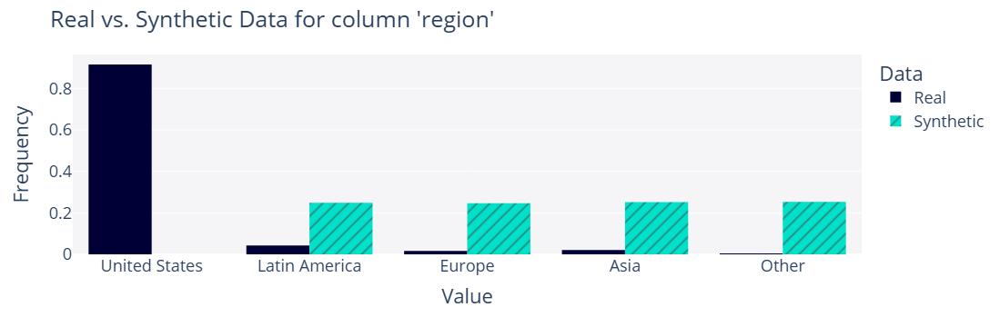

In [72]:
from sdv.evaluation.single_table import run_diagnostic, evaluate_quality
from sdv.evaluation.single_table import get_column_plot

# 1. perform basic validity checks
diagnostic = run_diagnostic(data_filtered, synthetic_data, metadata)

# 2. measure the statistical similarity
quality_report = evaluate_quality(data_filtered, synthetic_data, metadata)

# 3. plot the data
fig = get_column_plot(
    real_data=data_filtered,
    synthetic_data=synthetic_data,
    metadata=metadata,
    column_name='region'
)
    
fig.show()

### The resulting dataset is way more balanced now

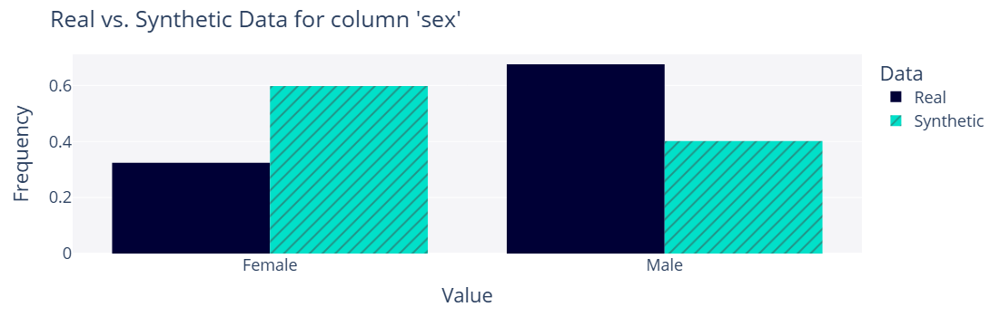

In [73]:
from sdv.evaluation.single_table import get_column_plot

fig = get_column_plot(
    real_data=data_filtered,
    synthetic_data=synthetic_data,
    metadata=metadata,
    column_name='sex'
)
    
fig.show()

In [74]:
#synthetic_data = pd.read_csv('synthetic_simulated_scenario4.csv', encoding='utf-8')  # For UTF-8
augmented_data = pd.concat([data_filtered, synthetic_data]).drop_duplicates()

In [75]:
augmented_data.to_csv("augmented_data.csv", index=False)
print("The DataFrame has been saved as 'augmented_data.csv'.")

The DataFrame has been saved as 'augmented_data.csv'.


In [30]:
#import pickle

# Load the synthesizer with pickle
#with open('my_synthesizer.pkl', 'rb') as f:
    #synthesizer = pickle.load(f)

# Verify the loaded synthesizer
#print(synthesizer)

In [32]:
#augmented_data = pd.read_csv("augmented_data.csv")

## Let's check if there is any inbalance on the "income" column

In [41]:
# Check the unique values and their counts in the "income" column
income_counts = augmented_data["income"].value_counts()

# Display the results
print("Unique values in the 'income' column and their counts:")
print(income_counts)


Unique values in the 'income' column and their counts:
income
<=50K    70485
>50K     14412
Name: count, dtype: int64


## Let's fix this issue by making a random undersample of the majority class

In [34]:
from sklearn.utils import resample

# Separate the majority and minority classes
majority_class = augmented_data[augmented_data['income'] == '<=50K']
minority_class = augmented_data[augmented_data['income'] == '>50K']

# Undersample the majority class to match the minority class
majority_undersampled = resample(
    majority_class,
    replace=False,  # Sample without replacement
    n_samples=len(minority_class),  # Match the number of minority class samples
    random_state=123  # Reproducibility
)

# Combine the undersampled majority class with the minority class
balanced_data = pd.concat([majority_undersampled, minority_class])

# Shuffle the data
balanced_data = balanced_data.sample(frac=1, random_state=123).reset_index(drop=True)

# Save the balanced dataset
balanced_data.to_csv("balanced_augmented_data.csv", index=False)

print("Balanced dataset created with 50/50 distribution. Saved as 'balanced_augmented_data.csv'.")



Balanced dataset created with 50/50 distribution. Saved as 'balanced_augmented_data.csv'.


In [72]:
# Check the unique values and their counts in the "income" column
income_counts = undersampled_data["income"].value_counts()

# Display the results
print("Unique values in the 'income' column and their counts:")
print(income_counts)


Unique values in the 'income' column and their counts:
income
<=50K    14412
>50K     14412
Name: count, dtype: int64


## Now there is no class imbalance


Race Distribution:
 race
White                 19110
Asian-Pac-Islander     6665
Black                  2586
Other                   463
Name: count, dtype: int64

Sex Distribution:
 sex
Male      16235
Female    12589
Name: count, dtype: int64

Region Distribution:
 region
United States    10064
Europe            6025
Asia              5441
Other             3728
Latin America     3566
Name: count, dtype: int64


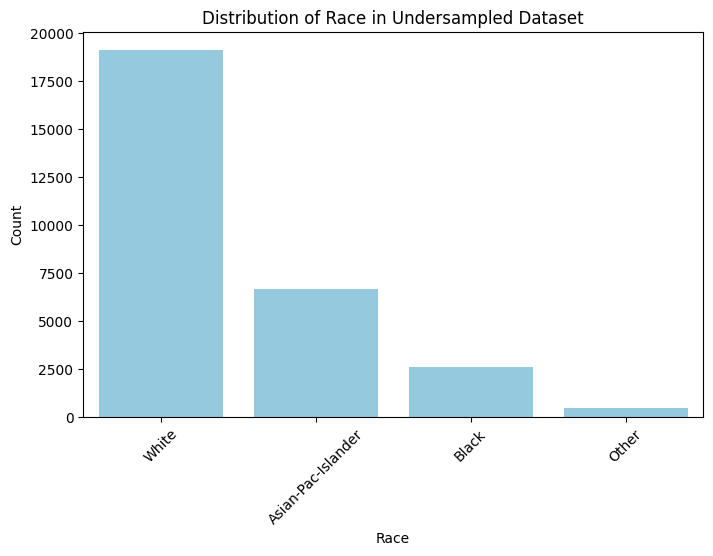

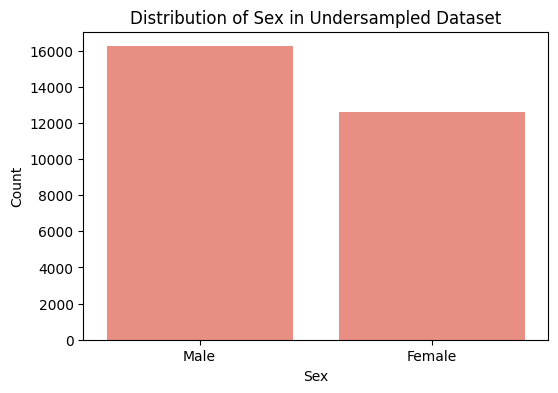

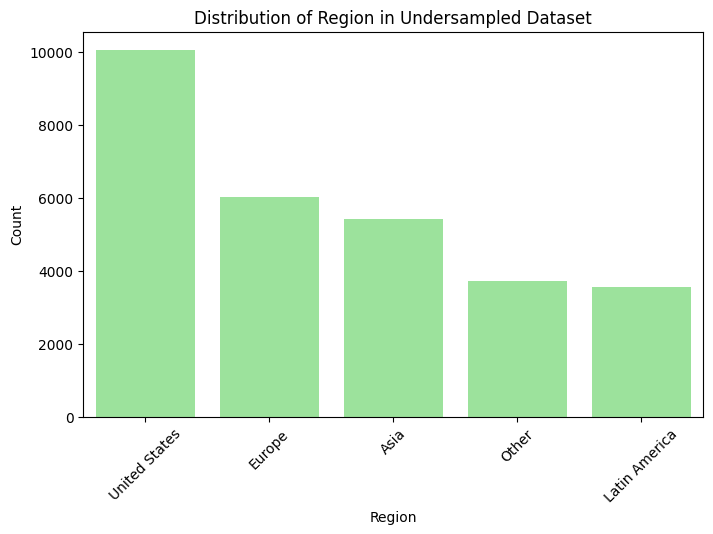

In [79]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the new undersampled dataset
undersampled_data = pd.read_csv("balanced_augmented_data.csv")

# Analyze the 'race' column distribution
if 'race' in undersampled_data.columns:
    race = undersampled_data['race']
    race_distribution = race.value_counts()
    print("\nRace Distribution:\n", race_distribution)
else:
    print("\nThe 'race' column is not present. Available columns are:\n", undersampled_data.columns)

# Analyze the 'sex' column distribution
if 'sex' in undersampled_data.columns:
    sex = undersampled_data['sex']
    sex_distribution = sex.value_counts()
    print("\nSex Distribution:\n", sex_distribution)
else:
    print("\nThe 'sex' column is not present. Available columns are:\n", undersampled_data.columns)

# Analyze the 'region' column distribution
if 'region' in undersampled_data.columns:
    region = undersampled_data['region']
    region_distribution = region.value_counts()
    print("\nRegion Distribution:\n", region_distribution)
else:
    print("\nThe 'region' column is not present. Available columns are:\n", undersampled_data.columns)

# Visualize Race Distribution
if 'race' in undersampled_data.columns:
    plt.figure(figsize=(8, 5))
    sns.barplot(x=race_distribution.index, y=race_distribution.values, color="skyblue")
    plt.title('Distribution of Race in Undersampled Dataset')
    plt.xlabel('Race')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.show()

# Visualize Sex Distribution
if 'sex' in undersampled_data.columns:
    plt.figure(figsize=(6, 4))
    sns.barplot(x=sex_distribution.index, y=sex_distribution.values, color="salmon")
    plt.title('Distribution of Sex in Undersampled Dataset')
    plt.xlabel('Sex')
    plt.ylabel('Count')
    plt.show()

# Visualize Region Distribution
if 'region' in undersampled_data.columns:
    plt.figure(figsize=(8, 5))
    sns.barplot(x=region_distribution.index, y=region_distribution.values, color="lightgreen")
    plt.title('Distribution of Region in Undersampled Dataset')
    plt.xlabel('Region')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.show()


# The visualizations seem good

## Let's now compare both accuricies / selection_rates of each class regarding each sensible feature

In [80]:
# For 'sex' as the sensitive feature
run_fairness_pipeline(undersampled_data, sensitive_feature="sex")

Sensitive Feature: sex, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: sex, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: sex, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: sex, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: sex, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: sex, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: sex, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: sex, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: sex, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: sex, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: sex, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: sex, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Featur

In [81]:
# For 'race' as the sensitive feature
run_fairness_pipeline(undersampled_data, sensitive_feature="race")

Sensitive Feature: race, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: race, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: race, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: race, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: race, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: race, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: race, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: race, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: race, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: race, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: race, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: race, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sens

In [82]:
# For 'region' as the sensitive feature
run_fairness_pipeline(undersampled_data, sensitive_feature="region")

Sensitive Feature: region, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: region, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: region, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: region, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: region, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: region, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: region, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: region, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: region, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: region, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: region, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: region, DP diff: 0.0000, accuracy: 0.0000, sel

# Comparing results:
## Before vs after data augmentation:

## With this procedure:

 The fairness interventions had mixed results across sensitive features. For sex, the DP difference improved significantly, reducing disparity, but accuracy dropped as a trade-off, indicating fairness at the cost of performance. For region, DP difference worsened, and selection rates became imbalanced, suggesting the intervention failed to ensure fairness across regions despite maintaining accuracy. For race, the DP difference increased, highlighting worsened disparities, though selection rates became more inclusive overall. While the dataset became more inclusive in some cases, these interventions often compromised accuracy and fairness inconsistently across groups, underscoring the need for better-balanced fairness strategies.

## Let's try another procedure

In [9]:
data2 = pd.read_csv("adult_preprocessed.csv")

In [12]:
from sdv.metadata import Metadata

metadata = Metadata.detect_from_dataframe(
    data=data2)

In [13]:
from sdv.single_table import TVAESynthesizer

synthesizer = TVAESynthesizer(metadata)
synthesizer.fit(data2)
synthesizer.save(
    filepath='my_synthesizerTVAE.pkl'
)

C:\Users\Rafa Parkoureiro\anaconda3\envs\IAS\Lib\site-packages\sdv\single_table\base.py:104: UserWarning: We strongly recommend saving the metadata using 'save_to_json' for replicability in future SDV versions.
  warnings.warn(


## Let's just create more entries for all the regions other then "united states" because it already has too many.
### Let's also make sure that 70% of this new synthetic data has *income '>50k'*

In [69]:
from sdv.sampling import Condition

# Adjusted conditions to favor income >=50K for all regions
conditions = []

# Proportion settings
income_high_proportion = 0.7  # 70% for income >=50K
income_low_proportion = 0.3  # 30% for income <=50K

# Define total population per region (replace with actual totals if necessary)
region_totals = {
    'Asia': 7000,
    'Europe': 7000,
    'Latin America': 7000,
    'Other': 7000
}

# Generate conditions for all regions
for region, total in region_totals.items():
    # Add conditions for income >=50K
    conditions.append(
        Condition(
            num_rows=int(income_high_proportion * total),
            column_values={'region': region, 'income': '>50K'}
        )
    )
    # Add conditions for income <=50K
    conditions.append(
        Condition(
            num_rows=int(income_low_proportion * total),
            column_values={'region': region, 'income': '<=50K'}
        )
    )

# Generate synthetic data
synthetic_data = synthesizer.sample_from_conditions(
    conditions=conditions,
    max_tries_per_batch=1000,
    output_file_path='syntheticzini.csv'
)


Sampling conditions:  84%|██████████████████████████████████████████████         | 23459/28000 [06:16<01:12, 62.23it/s]
C:\Users\Rafa Parkoureiro\anaconda3\envs\IAS\Lib\site-packages\sdv\single_table\utils.py:154: UserWarning:

Only able to sample 23459 rows for the given conditions. To sample more rows, try increasing `max_tries_per_batch` (currently: 1000). Note that increasing this value will also increase the sampling time.



In [79]:
augmented_income = pd.concat([data2, synthetic_data]).reset_index(drop=True)
augmented_income

,age,workclass,education.num,marital.status,occupation,relationship,race,sex,hours.per.week,income,region
0,82,Private,9,Widowed,Exec-managerial,Not-in-family,White,Female,18,<=50K,United States
1,54,Private,4,Divorced,Machine-op-inspct,Unmarried,White,Female,40,<=50K,United States
2,41,Private,10,Separated,Prof-specialty,Own-child,White,Female,40,<=50K,United States
3,34,Private,9,Divorced,Other-service,Unmarried,White,Female,45,<=50K,United States
4,38,Private,6,Separated,Adm-clerical,Unmarried,White,Male,40,<=50K,United States
...,...,...,...,...,...,...,...,...,...,...,...
53616,44,Self-emp-not-inc,9,Widowed,Other-service,Unmarried,Asian-Pac-Islander,Female,51,<=50K,Other
53617,27,State-gov,10,Never-married,Prof-specialty,Not-in-family,Asian-Pac-Islander,Male,35,<=50K,Other
53618,55,Private,13,Never-married,Exec-managerial,Not-in-family,Asian-Pac-Islander,Male,40,<=50K,Other
53619,29,Private,10,Married-civ-spouse,Other-service,Wife,Asian-Pac-Islander,Female,14,<=50K,Other


### Let's add the remaining 4k entries for "Other" with income >50k, which SDV couldn't complete because there were not much examples learned with that configuration

In [80]:
# Check if the required columns exist
if 'region' in augmented_income.columns and 'income' in augmented_income.columns:
    # Filter rows for Other with income > 50K
    other_above_50k = augmented_income[(augmented_income['region'] == 'Other') & (augmented_income['income'] == '>50K')]
    
    # Check if there are enough rows to duplicate
    if len(other_above_50k) > 0:
        # Randomly sample with replacement to create 4,000 new rows
        new_rows = other_above_50k.sample(n=4000, replace=True, random_state=42)
        
        # Append the new rows to the dataset
        augmented_income = pd.concat([augmented_income, new_rows]).reset_index(drop=True)
        print("Added 4,000 rows with income > 50K for the Other region.")
    else:
        print("No rows available to duplicate for the Other region with income > 50K.")
else:
    print("The required columns 'region' or 'income' are not present in the dataset.")


Added 4,000 rows with income > 50K for the Other region.



Race Distribution:
 race
White                 39676
Asian-Pac-Islander    13380
Black                  3174
Other                  1391
Name: count, dtype: int64

Sex Distribution:
 sex
Male      40428
Female    17193
Name: count, dtype: int64

Region Distribution:
 region
United States    27611
Latin America     8297
Asia              7634
Europe            7493
Other             6586
Name: count, dtype: int64


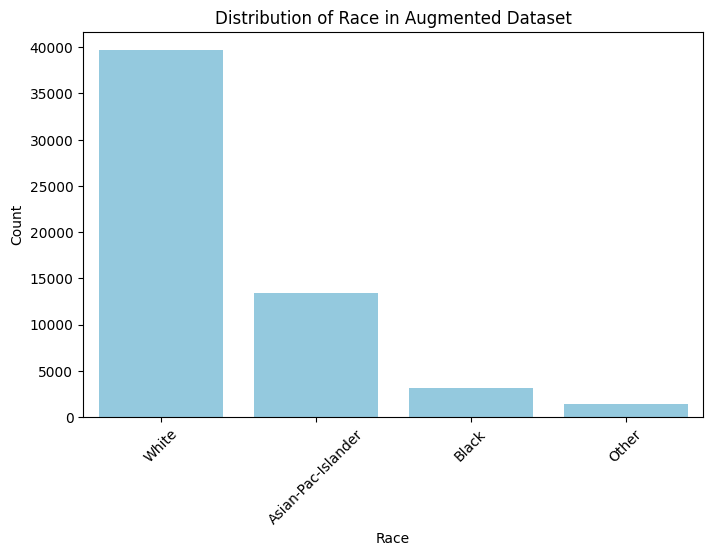

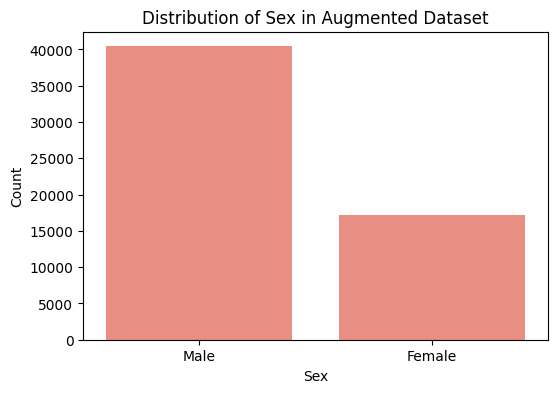

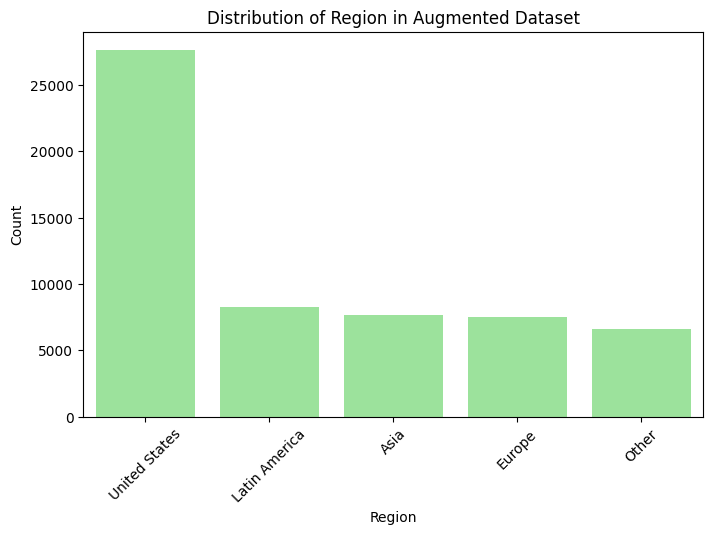

In [81]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Analyze the 'race' column distribution
if 'race' in augmented_income.columns:
    race = augmented_income['race']
    race_distribution = race.value_counts()
    print("\nRace Distribution:\n", race_distribution)
else:
    print("\nThe 'race' column is not present. Available columns are:\n", augmented_income.columns)

# Analyze the 'sex' column distribution
if 'sex' in augmented_income.columns:
    sex = augmented_income['sex']
    sex_distribution = sex.value_counts()
    print("\nSex Distribution:\n", sex_distribution)
else:
    print("\nThe 'sex' column is not present. Available columns are:\n", augmented_income.columns)

# Analyze the 'region' column distribution
if 'region' in augmented_income.columns:
    region = augmented_income['region']
    region_distribution = region.value_counts()
    print("\nRegion Distribution:\n", region_distribution)
else:
    print("\nThe 'region' column is not present. Available columns are:\n", augmented_income.columns)

# Visualize Race Distribution
if 'race' in augmented_income.columns:
    plt.figure(figsize=(8, 5))
    sns.barplot(x=race_distribution.index, y=race_distribution.values, color="skyblue")
    plt.title('Distribution of Race in Augmented Dataset')
    plt.xlabel('Race')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.show()

# Visualize Sex Distribution
if 'sex' in augmented_income.columns:
    plt.figure(figsize=(6, 4))
    sns.barplot(x=sex_distribution.index, y=sex_distribution.values, color="salmon")
    plt.title('Distribution of Sex in Augmented Dataset')
    plt.xlabel('Sex')
    plt.ylabel('Count')
    plt.show()

# Visualize Region Distribution
if 'region' in augmented_income.columns:
    plt.figure(figsize=(8, 5))
    sns.barplot(x=region_distribution.index, y=region_distribution.values, color="lightgreen")
    plt.title('Distribution of Region in Augmented Dataset')
    plt.xlabel('Region')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.show()


### Compared to the previous procedure, this one is way more realistic in the study-case scenario, specially regarding region ( there are more people competing to get in the highscools in NYC originated from united states then from other regions )

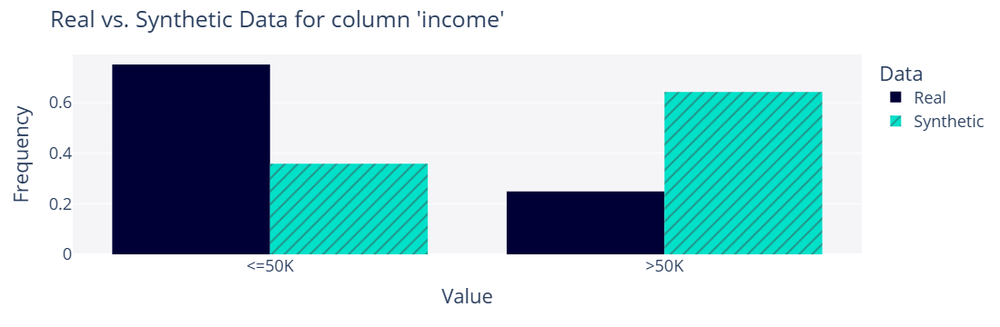

In [72]:
from sdv.evaluation.single_table import get_column_plot

fig = get_column_plot(
    real_data=data2,
    synthetic_data=synthetic_data,
    metadata=metadata,
    column_name='income'
)
    
fig.show()

In [93]:
from sdv.evaluation.single_table import run_diagnostic, evaluate_quality
from sdv.evaluation.single_table import get_column_plot

# 1. perform basic validity checks
diagnostic = run_diagnostic(data2, synthetic_data, metadata)

# 2. measure the statistical similarity
quality_report = evaluate_quality(data2, synthetic_data, metadata)

Generating report ...

(1/2) Evaluating Data Validity: |████████████████████████████████████████████████████| 11/11 [00:00<00:00, 459.29it/s]|
Data Validity Score: 100.0%

(2/2) Evaluating Data Structure: |█████████████████████████████████████████████████████| 1/1 [00:00<00:00, 996.75it/s]|
Data Structure Score: 100.0%

Overall Score (Average): 100.0%

Generating report ...

(1/2) Evaluating Column Shapes: |████████████████████████████████████████████████████| 11/11 [00:00<00:00, 159.56it/s]|
Column Shapes Score: 72.7%

(2/2) Evaluating Column Pair Trends: |███████████████████████████████████████████████| 55/55 [00:00<00:00, 120.22it/s]|
Column Pair Trends Score: 57.13%

Overall Score (Average): 64.91%



In [94]:
# Check the unique values and their counts in the "income" column
income_counts = augmented_income["income"].value_counts()

# Display the results
print("Unique values in the 'income' column and their counts:")
print(income_counts)


Unique values in the 'income' column and their counts:
income
<=50K    31054
>50K     26567
Name: count, dtype: int64


In [95]:
# Check if the necessary columns exist
if 'region' in augmented_income.columns and 'income' in augmented_income.columns:
    # Count rows grouped by region and income
    income_region_distribution = augmented_income.groupby(['region', 'income']).size().reset_index(name='count')
    print("\nNumber of rows with income by region:")
    print(income_region_distribution)
else:
    print("\nThe columns 'region' or 'income' are not present. Available columns are:\n", augmented_income.columns)



Number of rows with income by region:
          region income  count
0           Asia  <=50K   2531
1           Asia   >50K   5103
2         Europe  <=50K   2444
3         Europe   >50K   5049
4  Latin America  <=50K   3290
5  Latin America   >50K   5007
6          Other  <=50K   2209
7          Other   >50K   4377
8  United States  <=50K  20580
9  United States   >50K   7031


### To keep the ratio, let's take out 15k entries from united states which receive less or equal then 50k

In [85]:
# Check if the required columns exist
if 'region' in augmented_income.columns and 'income' in augmented_income.columns:
    # Filter rows for United States with income <= 50K
    us_below_50k = augmented_income[(augmented_income['region'] == 'United States') & (augmented_income['income'] == '<=50K')]
    
    # Check if there are enough rows to remove
    if len(us_below_50k) >= 15000:
        # Randomly sample 15,000 rows
        rows_to_remove = us_below_50k.sample(n=15000, random_state=42).index
        
        # Drop these rows from the dataset
        augmented_income_no_usa = augmented_income.drop(rows_to_remove).reset_index(drop=True)
        print("Removed 15,000 rows with income <= 50K for the United States.")
    else:
        print(f"Not enough rows to remove. Available: {len(us_below_50k)}")
else:
    print("The required columns 'region' or 'income' are not present in the dataset.")


Removed 15,000 rows with income <= 50K for the United States.


In [87]:
# Check if the necessary columns exist
if 'region' in augmented_income.columns and 'income' in augmented_income.columns:
    # Count rows grouped by region and income
    income_region_distribution = augmented_income_no_usa.groupby(['region', 'income']).size().reset_index(name='count')
    print("\nNumber of rows with income by region:")
    print(income_region_distribution)
else:
    print("\nThe columns 'region' or 'income' are not present. Available columns are:\n", augmented_income.columns)


Number of rows with income by region:
          region income  count
0           Asia  <=50K   2531
1           Asia   >50K   5103
2         Europe  <=50K   2444
3         Europe   >50K   5049
4  Latin America  <=50K   3290
5  Latin America   >50K   5007
6          Other  <=50K   2209
7          Other   >50K   4377
8  United States  <=50K   5580
9  United States   >50K   7031


In [126]:
augmented_income_no_usa.to_csv('augmented_income_no_usa.csv', index=False)


## Now the dataset is way more balanced, without loosing its information totally

In [86]:
run_fairness_pipeline(augmented_income_no_usa, sensitive_feature="region")

Sensitive Feature: region, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: region, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: region, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: region, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: region, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: region, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: region, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: region, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: region, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: region, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: region, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: region, DP diff: 0.0000, accuracy: 0.0000, sel

In [88]:
run_fairness_pipeline(augmented_income_no_usa, sensitive_feature="sex")

Sensitive Feature: sex, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: sex, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: sex, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: sex, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: sex, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: sex, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: sex, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: sex, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: sex, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: sex, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: sex, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: sex, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Featur

In [89]:
run_fairness_pipeline(augmented_income_no_usa, sensitive_feature="race")

Sensitive Feature: race, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: race, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: race, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: race, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: race, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: race, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: race, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: race, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: race, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: race, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: race, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sensitive Feature: race, DP diff: 0.0000, accuracy: 0.0000, selection_rate: 0.0000
Sens

## Let's compare this procedure to the original dataset:

# Conclusions:

## The new fairness interventions show significant improvement across the three sensitive features, reducing disparities and making the model outcomes fairer for society. 
- For sex, the DP difference increased slightly from 0.0760 to 0.1103, but selection rates became much more balanced between males and females, indicating improved inclusivity despite a drop in accuracy.
- For region, the DP difference decreased substantially from 0.3265 to 0.1150, and selection rates became more uniform across regions, demonstrating a notable reduction in bias while maintaining reasonable accuracy.
-  For race, the DP difference improved slightly from 0.0804 to 0.0649, with significantly higher and more balanced selection rates across racial groups, ensuring a fairer distribution of outcomes.
### This procedure successfully reduces bias and creates more equitable outcomes, aligning better with societal fairness objectives by ensuring underrepresented groups receive more favorable treatment.

## 1st procedure VS. 2nd procedure

- **Metrics Differences: In the second procedure, the DP difference consistently improved (or remained reasonable), selection rates became more balanced across groups, and accuracy was maintained at acceptable levels despite the fairness interventions. This contrasted with the first procedure, which showed uneven changes in these metrics, with some sensitive features experiencing worsened disparities.**

- **Impacts to Society: The second procedure promotes more equitable decision-making, ensuring that outcomes are distributed fairly across underrepresented groups, which helps reduce systemic biases and creates a more inclusive and just societal impact.**

C:\Users\Rafa Parkoureiro\anaconda3\envs\IAS\Lib\site-packages\xgboost\core.py:158: UserWarning: [17:00:15] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0c55ff5f71b100e98-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Accuracy: 0.8609
Precision: 0.8509
Recall: 0.9419
F1 Score: 0.8941


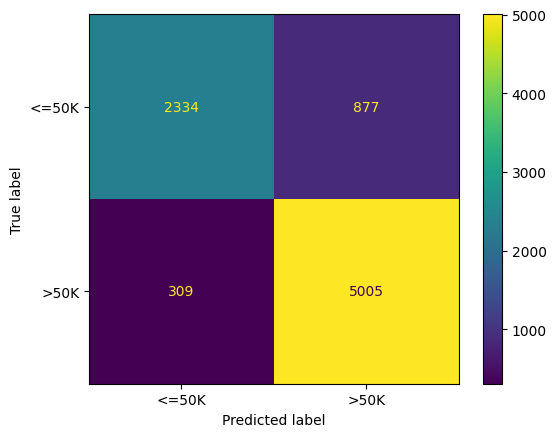


Classification Report:
              precision    recall  f1-score   support

       <=50K       0.88      0.73      0.80      3211
        >50K       0.85      0.94      0.89      5314

    accuracy                           0.86      8525
   macro avg       0.87      0.83      0.85      8525
weighted avg       0.86      0.86      0.86      8525



In [14]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    accuracy_score, confusion_matrix, ConfusionMatrixDisplay,
    precision_score, recall_score, f1_score, classification_report
)
from sklearn.preprocessing import OneHotEncoder, LabelEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from xgboost import XGBClassifier
import matplotlib.pyplot as plt

# Prepare the data
X = augmented_income_no_usa.drop(columns=["income"])  # Replace 'income' with your target column name
y = augmented_income_no_usa["income"]

# Convert target labels to numeric
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)  # '<=50K' -> 0, '>50K' -> 1

# Identify categorical columns
categorical_columns = X.select_dtypes(include=["object", "category"]).columns

# Preprocessing pipeline
preprocessor = ColumnTransformer(
    transformers=[
        ("cat", OneHotEncoder(drop="if_binary", sparse_output=False), categorical_columns),
    ],
    remainder="passthrough"  # Leave other columns (numerical) as is
)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, stratify=y, random_state=42
)

# Create a pipeline with preprocessing and model
pipeline = Pipeline(
    steps=[
        ("preprocessor", preprocessor),
        ("classifier", XGBClassifier(
            n_estimators=100,
            max_depth=6,
            learning_rate=0.1,
            random_state=42,
            use_label_encoder=False,
            eval_metric="logloss"
        )),
    ]
)

# Train the model
pipeline.fit(X_train, y_train)

# Make predictions
y_pred = pipeline.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=label_encoder.classes_)
disp.plot()
plt.show()

# Classification Report
print("\nClassification Report:")
print(classification_report(y_test, y_pred, target_names=label_encoder.classes_))


### Let's try using LIME to give us a explainability why an instance is classified as <=50k income

In [13]:
augmented_income_no_usa=pd.read_csv('augmented_income_no_usa.csv')

In [26]:
import lime
import lime.lime_tabular
import numpy as np
import pandas as pd

# Get transformed training data
X_train_transformed = pipeline.named_steps['preprocessor'].transform(X_train)

# Get feature names after preprocessing
cat_feature_names = pipeline.named_steps['preprocessor'].named_transformers_['cat'].get_feature_names_out(categorical_columns)
numerical_columns = X.select_dtypes(exclude=["object", "category"]).columns
feature_names = list(numerical_columns) + list(cat_feature_names)

# Create LIME explainer with transformed data
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train_transformed,
    feature_names=feature_names,
    class_names=['<=50K', '>50K'],
    mode='classification'
)

# Find first instance predicted as <=50K in test set
low_income_idx = np.where((y_test == 0) & (y_pred == 0))[0][0]
sample = X_test.iloc[low_income_idx]

# Transform the sample data
sample_transformed = pipeline.named_steps['preprocessor'].transform(sample.to_frame().T)[0]

# Create prediction function for transformed data
def predict_fn(X):
    # LIME will pass numpy array, we need to handle that
    if len(X.shape) == 1:
        X = X.reshape(1, -1)
    return pipeline.named_steps['classifier'].predict_proba(X)

# Generate explanation
exp = explainer.explain_instance(
    data_row=sample_transformed,
    predict_fn=predict_fn,
    num_features=10
)

# Print original instance details
print("Original instance details:")
for feature, value in sample.items():
    print(f"{feature}: {value}")

print("\nModel's prediction probabilities:", pipeline.predict_proba(sample.to_frame().T)[0])
print("\nTop factors influencing the prediction:")
for feature, weight in exp.as_list():
    print(f"{feature}: {weight:0.4f}")

# Save visualization
exp.save_to_file('lime_explanation.html')
print("\nDetailed explanation saved to 'lime_explanation.html'")


Original instance details:
age: 28
workclass: Private
education.num: 5
marital.status: Never-married
occupation: Other-service
relationship: Own-child
race: Asian-Pac-Islander
sex: Male
hours.per.week: 32
region: Other

Model's prediction probabilities: [0.9982831  0.00171688]

Top factors influencing the prediction:
relationship_Other-relative <= 0.00: 0.3290
marital.status_Married-civ-spouse <= 0.00: -0.2653
relationship_Own-child > 0.00: -0.2563
education.num <= -0.33: -0.2397
hours.per.week <= -0.33: -0.2306
relationship_Wife <= 0.00: -0.2246
age <= -0.79: -0.1883
0.00 < sex_Male <= 1.00: 0.1288
occupation_Farming-fishing <= 0.00: 0.0902
marital.status_Widowed <= 0.00: -0.0760

Detailed explanation saved to 'lime_explanation.html'


In [28]:
# Show the explanation visualization
exp.show_in_notebook(show_table=True)

### The model classified the instance as belonging to the ≤50K income group, with key contributing factors including the individual's 'Own-child' relationship status, low education level, fewer hours worked per week, and younger age, all of which negatively influenced the income prediction, as shown in the LIME explanation. 
### On the other hand, being male slightly positively influenced the prediction.

-----------------------------------------------------------------------------------------------------------------------------------------

# Second Approach

In this approach a different data preparation will be used, as well as a different oversampling method.
Some features that were already mapped earlier to reduce the different values into less, will be changed again to binary features, separating the values into "majority" and "minority", or, if not possible, at least fewer values.

In [156]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import recall_score, confusion_matrix, ConfusionMatrixDisplay, accuracy_score, classification_report
from sklearn.tree import DecisionTreeClassifier
from imblearn.over_sampling import ADASYN
from xgboost import XGBClassifier
from fairlearn.metrics import MetricFrame, demographic_parity_difference, equalized_odds_difference
import warnings

In [157]:
data = pd.read_csv("adult_preprocessed.csv")
data.head()

,age,workclass,education.num,marital.status,occupation,relationship,race,sex,hours.per.week,income,region
0,82,Private,9,Widowed,Exec-managerial,Not-in-family,White,Female,18,<=50K,United States
1,54,Private,4,Divorced,Machine-op-inspct,Unmarried,White,Female,40,<=50K,United States
2,41,Private,10,Separated,Prof-specialty,Own-child,White,Female,40,<=50K,United States
3,34,Private,9,Divorced,Other-service,Unmarried,White,Female,45,<=50K,United States
4,38,Private,6,Separated,Adm-clerical,Unmarried,White,Male,40,<=50K,United States


In [158]:
print(data['region'].value_counts())

region
United States    27611
Latin America     1297
Asia               634
Europe             493
Other              127
Name: count, dtype: int64


In [159]:
# Define a mapping for countries
country_to_region = {
    'United States': 'United States',
    'Asia': 'Foreigner',
    'Latin America': 'Foreigner',
    'Europe': 'Foreigner',
    'Ohter': 'Foreigner'
}

# Map the countries to regions
data_mapped = data.copy()
data_mapped['region'] = data['region'].map(country_to_region)

# Check the new grouped column
print(data_mapped['region'].value_counts())


region
United States    27611
Foreigner         2424
Name: count, dtype: int64


In [160]:
# Define a mapping for races
race_mapping = {
    'White': 'White',
    'Black': 'Non-white',
    'Asian-Pac-Islander': 'Non-white',
    'Other': 'Non-white',
    'Amer-Indian-Eskimo': 'Non-white',
}

# Map the countries to regions
data_mapped['race_mapped'] = data_mapped['race'].map(race_mapping)
data_mapped = data_mapped.drop(columns='race')
# Check the new grouped column
print(data_mapped['race_mapped'].value_counts())


race_mapped
White        25933
Non-white     4229
Name: count, dtype: int64


In [161]:
# Define a mapping for marital status

marital_mapping = {
    'Married-civ-spouse': 'Married',
    'Never-married': 'Not married',
    'Divorced': 'Not married',
    'Separated': 'Not married',
    'Widowed': 'Not married',
    'Married-spouse-absent': 'Married',
    'Married-AF-spouse': 'Married'
}

# Map the countries to regions
data_mapped['marital'] = data_mapped['marital.status'].map(marital_mapping)
data_mapped = data_mapped.drop(columns='marital.status')
# Check the new grouped column
print(data_mapped['marital'].value_counts())


marital
Not married    15706
Married        14456
Name: count, dtype: int64


In [162]:
# Define a mapping for occupation

occupation_mapping = {
    "Prof-specialty": "White-collar",
    "Exec-managerial": "White-collar",
    "Adm-clerical": "White-collar",
    "Sales": "White-collar",
    "Tech-support": "White-collar",
    "Craft-repair": "Blue-collar",
    "Machine-op-inspct": "Blue-collar",
    "Transport-moving": "Blue-collar",
    "Handlers-cleaners": "Blue-collar",
    "Farming-fishing": "Blue-collar",
    "Other-service": "Service",
    "Protective-serv": "Service",
    "Priv-house-serv": "Service",
    "Armed-Forces": "Service" # doesnt fit any of the above, but added to service to prevent noise
}

# Apply the mapping to the 'occupation' column
data_mapped["occupation_map"] = data_mapped["occupation"].map(occupation_mapping)
data_mapped = data_mapped.drop(columns='occupation')
# Verify the transformation
print(data_mapped["occupation_map"].value_counts())

occupation_map
White-collar    16247
Blue-collar      9907
Service          4008
Name: count, dtype: int64


In [163]:
# Define the mapping
workclass_mapping = {
    "Private": "Private",
    "Self-emp-not-inc": "Self-employed",
    "Self-emp-inc": "Self-employed",
    "Local-gov": "Government",
    "State-gov": "Government",
    "Federal-gov": "Government",
    "Without-pay": "Self-employed" # doesnt fit any of the above, but added to self employed to prevent noise
}

# Apply the mapping
data_mapped["workclass_map"] = data_mapped["workclass"].map(workclass_mapping)
data_mapped = data_mapped.drop(columns='workclass')
# Verify the transformation
print(data_mapped["workclass_map"].value_counts())


workclass_map
Private          22286
Government        4289
Self-employed     3587
Name: count, dtype: int64


In [164]:
# Define the mapping
relationship_mapping = {
    "Husband": "Spouse",
    "Wife": "Spouse",
    "Own-child": "Child",
    "Other-relative": "Relative",
    "Not-in-family": "Independent",
    "Unmarried": "Independent"
}

# Apply the mapping
data_mapped["relationship_map"] = data_mapped["relationship"].map(relationship_mapping)
data_mapped = data_mapped.drop(columns='relationship')
# Verify the transformation
print(data_mapped["relationship_map"].value_counts())


relationship_map
Spouse         13869
Independent    10938
Child           4466
Relative         889
Name: count, dtype: int64


### Now, we see the new distribution after the mapping

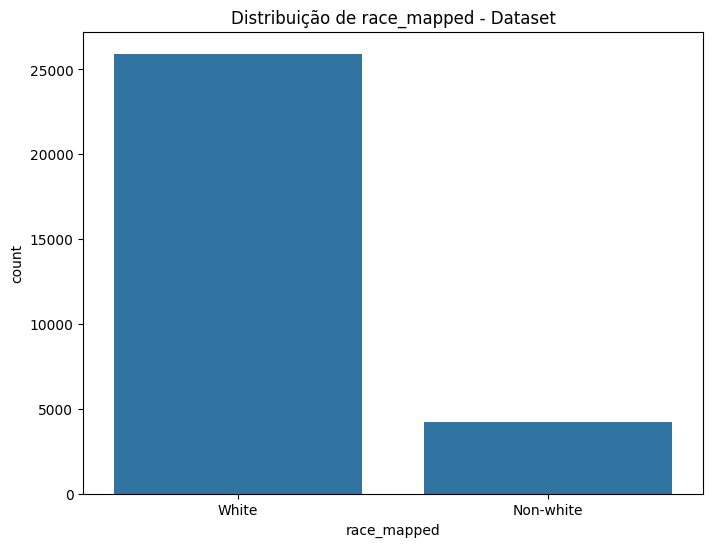

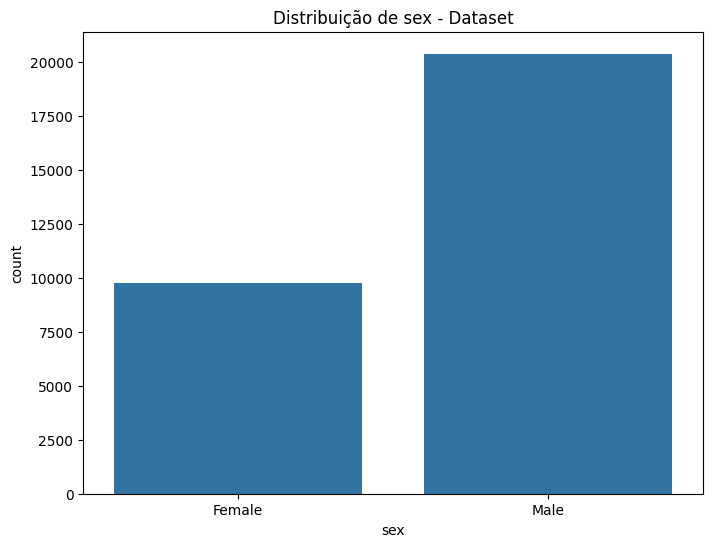

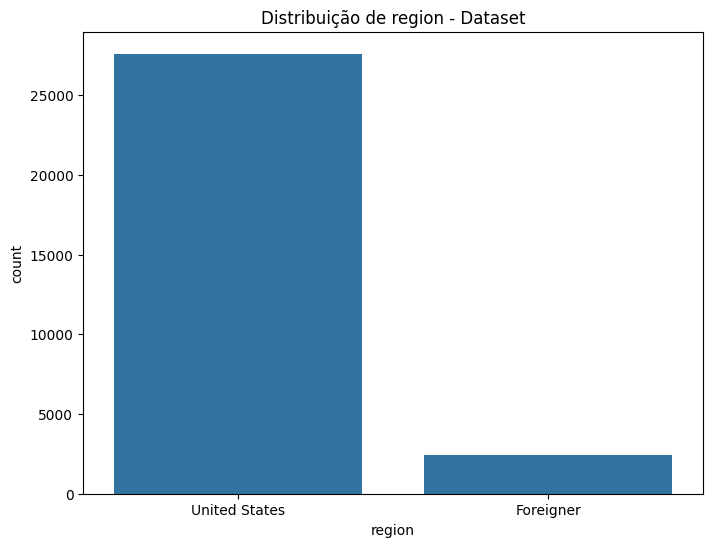

In [165]:
def plot_sensitive_distribution(data, sensitive_attr, title):
    plt.figure(figsize=(8, 6))
    sns.countplot(x=sensitive_attr, data=data)
    plt.title(f'Distribuição de {sensitive_attr} - {title}')
    plt.show()

# Dataset completo
plot_sensitive_distribution(data_mapped, 'race_mapped', 'Dataset')
plot_sensitive_distribution(data_mapped, 'sex', 'Dataset')
plot_sensitive_distribution(data_mapped, 'region', 'Dataset')

## It is also important to see the income distribution between classes
The results show that for every minority, the positive/negative income ratio is even more drastical than between privileged groups

In [166]:
# Analyze sensitive attributes
df = data_mapped.copy()
print("Distribution by race:")
print(df["race_mapped"].value_counts())

print("\nDistribution by sex:")
print(df["sex"].value_counts())

print("\nDistribution by region:")
print(df["region"].value_counts())

# Cross-tabulate sensitive attributes with the target variable
print("\nIncome distribution by race:")
print(pd.crosstab(df["race_mapped"], df["income"], normalize="index"))

print("\nIncome distribution by sex:")
print(pd.crosstab(df["sex"], df["income"], normalize="index"))

print("\nIncome distribution by region:")
print(pd.crosstab(df["region"], df["income"], normalize="index"))

Distribution by race:
race_mapped
White        25933
Non-white     4229
Name: count, dtype: int64

Distribution by sex:
sex
Male      20380
Female     9782
Name: count, dtype: int64

Distribution by region:
region
United States    27611
Foreigner         2424
Name: count, dtype: int64

Income distribution by race:
income          <=50K      >50K
race_mapped                    
Non-white    0.841807  0.158193
White        0.736282  0.263718

Income distribution by sex:
income     <=50K      >50K
sex                       
Female  0.886322  0.113678
Male    0.686163  0.313837

Income distribution by region:
income            <=50K      >50K
region                           
Foreigner      0.810644  0.189356
United States  0.745355  0.254645


In [168]:
print(df.columns)
print(df['region'].value_counts())

Index(['age', 'education.num', 'sex', 'hours.per.week', 'income', 'region',
       'race_mapped', 'marital', 'occupation_map', 'workclass_map',
       'relationship_map'],
      dtype='object')
region
United States    27611
Foreigner         2424
Name: count, dtype: int64


## Preparing the data for model training

### Scaling numerical columns and one-hot-encoding the categorical features

In [169]:
# Identify categorical and numerical columns

categorical_cols = df.select_dtypes(include=["object"]).columns

numerical_cols = df.select_dtypes(include=["int64", "float64"]).columns

In [170]:
# One-hot encode categorical columns
from sklearn.preprocessing import OneHotEncoder, StandardScaler

encoder = OneHotEncoder(sparse_output=False, drop="first")  # Updated argument name

df_encoded = pd.DataFrame(
    encoder.fit_transform(df[categorical_cols]), 
    columns=encoder.get_feature_names_out(categorical_cols)
)


In [171]:
# Normalize numerical columns

scaler = StandardScaler()

df_scaled = pd.DataFrame(scaler.fit_transform(df[numerical_cols]), columns=numerical_cols)

In [172]:
df_processed = df_scaled.join(df_encoded)
df_processed = pd.DataFrame(df_processed)

In [177]:
# Separating features and target variable

X = df_processed.drop(columns=["income_>50K"])  # Drop target column

y = df_processed["income_>50K"]


In [178]:
X.head()

,age,education.num,hours.per.week,sex_Male,region_United States,race_mapped_White,marital_Not married,occupation_map_Service,occupation_map_White-collar,workclass_map_Private,workclass_map_Self-employed,relationship_map_Independent,relationship_map_Relative,relationship_map_Spouse
0,3.316630,-0.439738,-1.914161,0.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0
1,1.184831,-2.400559,-0.077734,0.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
2,0.195067,-0.047574,-0.077734,0.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0
3,-0.337883,-0.439738,0.339636,0.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0
4,-0.033340,-1.616231,-0.077734,1.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0


# The model
## We experimented using two different models: the XGBoost and Decision Tree classifiers.

In [179]:
# Split into training and test sets

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)

In [180]:
# Reset index for all groups
X_train = X_train.reset_index(drop=True)
X_test = X_test.reset_index(drop=True)
y_train = y_train.reset_index(drop=True)
y_test = y_test.reset_index(drop=True)


In [181]:
# Initialize the XGBoost classifier
model_pre = XGBClassifier(
    eval_metric="logloss",    # Set evaluation metric
    random_state=42,
    n_estimators=100,         # Number of boosting rounds
    learning_rate=0.1,        # Step size shrinkage
    max_depth=6,              # Maximum depth of trees
    subsample=0.8,            # Fraction of samples used for training
    colsample_bytree=0.8      # Fraction of features used for training
)

# Train the model on the oversampled training set
model_pre.fit(X_train, y_train)

# Test the model
y_pred_pre = model_pre.predict(X_test)

# Evaluate performance
print("Classification Report (Test Set):")
print(classification_report(y_test, y_pred_pre))
print("Accuracy (Test Set):", accuracy_score(y_test, y_pred_pre))

Classification Report (Test Set):
              precision    recall  f1-score   support

         0.0       0.87      0.92      0.90      6797
         1.0       0.72      0.59      0.64      2252

    accuracy                           0.84      9049
   macro avg       0.79      0.75      0.77      9049
weighted avg       0.83      0.84      0.83      9049

Accuracy (Test Set): 0.8392087523483258


### Calculating fariness metrics each sensitive feature
These metrics allow us to evaluate the fairness in the model's predictions. The model will be evaluated in Disparate Impact, Equality of Opportunity Difference and True Positive Rate.

In [182]:
def calculate_disparate_impact_subset(y_true, sensitive_feature_values, privileged_group, positive_outcome):
    """
    Calculate Disparate Impact (DI) for a given dataset subset.
    """
    privileged = sensitive_feature_values == privileged_group
    unprivileged = ~privileged

    # Calculate positive outcome rates
    privileged_rate = (y_true[privileged] == positive_outcome).mean()
    unprivileged_rate = (y_true[unprivileged] == positive_outcome).mean()

    # Safeguard for division by zero
    if privileged_rate == 0 or unprivileged_rate == 0:
        return 0  # Return 0 or another meaningful value

    return unprivileged_rate / privileged_rate

# Extract sensitive feature values for training data
race_mapped_train = X_train.loc[y_train.index, "race_mapped_White"]

# Calculate DI for race
di_race = calculate_disparate_impact_subset(
    y_true=y_train,
    sensitive_feature_values=race_mapped_train,
    privileged_group=1,
    positive_outcome=1
)
print("\nDisparate Impact (Race):", di_race)

# Extract sensitive feature values for training data
sex_train = X_train.loc[y_train.index, "sex_Male"]

# Calculate DI for sex
di_sex = calculate_disparate_impact_subset(
    y_true=y_train,
    sensitive_feature_values=sex_train,
    privileged_group=1,
    positive_outcome=1
)
print("\nDisparate Impact (Sex):", di_sex)

# Extract sensitive feature values for training data
region_train = X_train.loc[y_train.index, "region_United States"]

# Calculate DI for race
di_region = calculate_disparate_impact_subset(
    y_true=y_train,
    sensitive_feature_values=region_train,
    privileged_group=1,
    positive_outcome=1
)
print("\nDisparate Impact (Region):", di_region)

y_pred_train = model_pre.predict(X_train)


Disparate Impact (Race): 0.5869096595502414

Disparate Impact (Sex): 0.3651704864740436

Disparate Impact (Region): 0.7602075054674209


In [183]:
from sklearn.metrics import recall_score

def calculate_eod(y_true, y_pred, sensitive_feature, privileged_group):
    privileged = X_train.loc[y_true.index, sensitive_feature] == privileged_group
    unprivileged = ~privileged

    privileged_tpr = recall_score(y_true[privileged], y_pred[privileged])
    unprivileged_tpr = recall_score(y_true[unprivileged], y_pred[unprivileged])

    return privileged_tpr - unprivileged_tpr

# Calculate EOD for race
eod_race = calculate_eod(
    y_true=y_train,
    y_pred=y_pred_train,
    sensitive_feature="race_mapped_White",
    privileged_group=1
)
print("\nEquality of Opportunity Difference (Race):", eod_race)

# Calculate EOD for sex
eod_sex = calculate_eod(
    y_true=y_train,
    y_pred=y_pred_train,
    sensitive_feature="sex_Male",
    privileged_group=1
)
print("\nEquality of Opportunity Difference (Sex):", eod_sex)

# Calculate EOD for region
eod_region = calculate_eod(
    y_true=y_train,
    y_pred=y_pred_train,
    sensitive_feature="region_United States",
    privileged_group=1
)
print("\nEquality of Opportunity Difference (Region):", eod_region)


Equality of Opportunity Difference (Race): 0.13121511436093214

Equality of Opportunity Difference (Sex): 0.08121486577989445

Equality of Opportunity Difference (Region): 0.026037378378617637


In [184]:
# Debug TPRs
privileged_mask_race = X_train.loc[y_train.index, "race_mapped_White"] == 1
unprivileged_mask_race = ~privileged_mask_race

privileged_tpr_race = recall_score(y_train[privileged_mask_race], y_pred_train[privileged_mask_race])
unprivileged_tpr_race = recall_score(y_train[unprivileged_mask_race], y_pred_train[unprivileged_mask_race])

print(f"Privileged TPR Race: {privileged_tpr_race}")
print(f"Unprivileged TPR Race: {unprivileged_tpr_race}")

# Debug TPRs
privileged_mask_sex = X_train.loc[y_train.index, "sex_Male"] == 1
unprivileged_mask_sex = ~privileged_mask_sex

privileged_tpr_sex = recall_score(y_train[privileged_mask_sex], y_pred_train[privileged_mask_sex])
unprivileged_tpr_sex = recall_score(y_train[unprivileged_mask_sex], y_pred_train[unprivileged_mask_sex])

print(f"Privileged TPR Sex: {privileged_tpr_sex}")
print(f"Unprivileged TPR Sex: {unprivileged_tpr_sex}")

# Debug TPRs
privileged_mask_region = X_train.loc[y_train.index, "region_United States"] == 1
unprivileged_mask_region = ~privileged_mask_region

privileged_tpr_region = recall_score(y_train[privileged_mask_region], y_pred_train[privileged_mask_region])
unprivileged_tpr_region = recall_score(y_train[unprivileged_mask_region], y_pred_train[unprivileged_mask_region])

print(f"Privileged TPR Region: {privileged_tpr_region}")
print(f"Unprivileged TPR Region: {unprivileged_tpr_region}")


Privileged TPR Race: 0.6301398455437278
Unprivileged TPR Race: 0.4989247311827957
Privileged TPR Sex: 0.6307072515666965
Unprivileged TPR Sex: 0.549492385786802
Privileged TPR Region: 0.6202402769293422
Unprivileged TPR Region: 0.5942028985507246


### Understanding bias metrics
Bias metrics are critical tools for evaluating the fairness of machine learning models, especially when dealing with sensitive attributes such as race, gender, or region. These metrics help identify disparities in model performance and outcomes across different groups, guiding efforts to mitigate bias.

#### Disparate impact: 
Measures the ratio of positive outcomes for an unprivileged group compared to a privileged group. A value close to 1 indicates fairness, while values significantly below or above 1 suggest potential bias.
#### Equality of Opportunity Difference (EOD):
Focuses on the difference in True Positive Rates (TPR) between privileged and unprivileged groups. A low EOD value indicates that the model performs equally well across groups in predicting positive outcomes.



### Lets see confusion matrices to understand the true/negatives positive and negative predictions

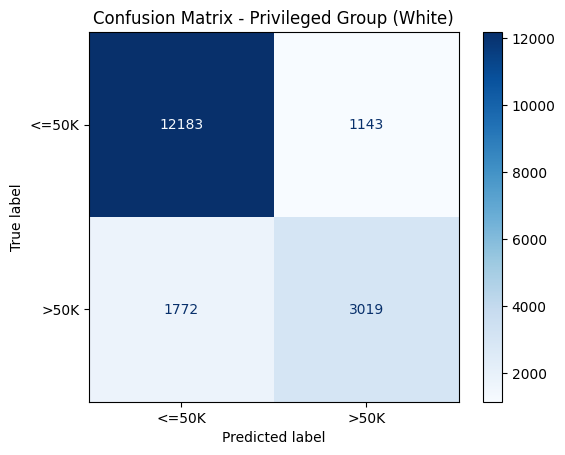

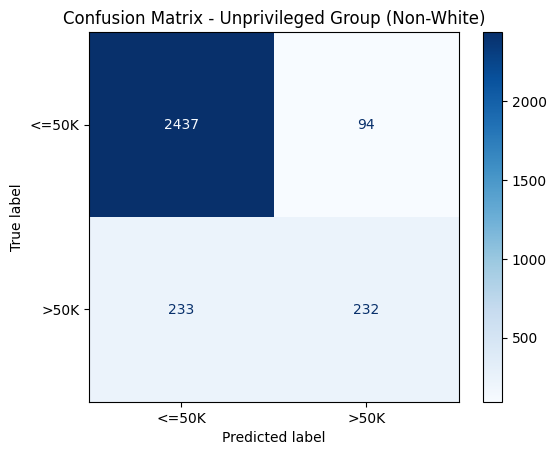

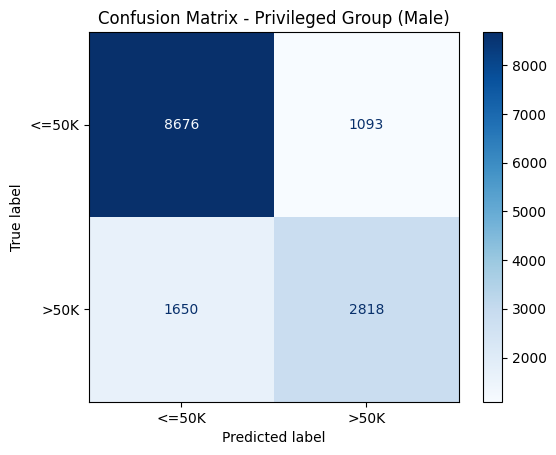

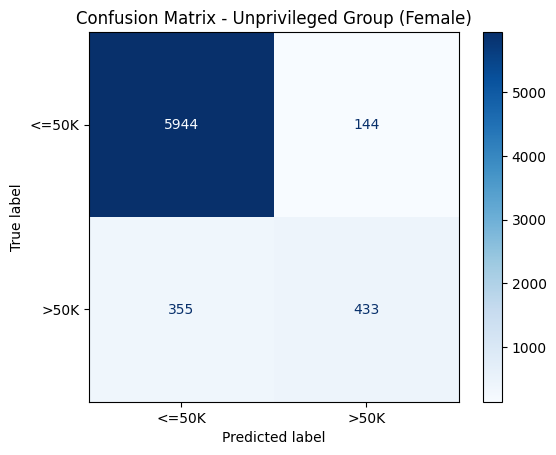

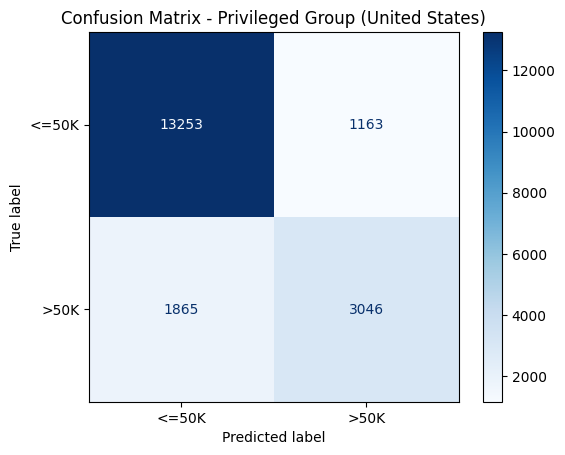

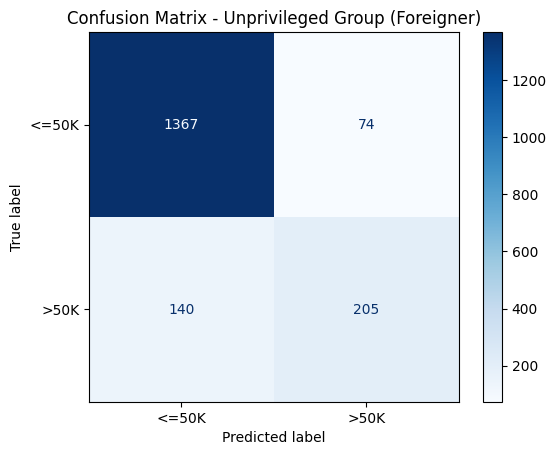

In [185]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# Privileged group confusion matrix
privileged_cm_race = confusion_matrix(y_train[privileged_mask_race], y_pred_train[privileged_mask_race])
disp_privileged_race = ConfusionMatrixDisplay(confusion_matrix=privileged_cm_race, display_labels=["<=50K", ">50K"])
disp_privileged_race.plot(cmap="Blues")
plt.title("Confusion Matrix - Privileged Group (White)")
plt.show()

# Unprivileged group confusion matrix
unprivileged_cm_race = confusion_matrix(y_train[unprivileged_mask_race], y_pred_train[unprivileged_mask_race])
disp_unprivileged_race = ConfusionMatrixDisplay(confusion_matrix=unprivileged_cm_race, display_labels=["<=50K", ">50K"])
disp_unprivileged_race.plot(cmap="Blues")
plt.title("Confusion Matrix - Unprivileged Group (Non-White)")
plt.show()

# Privileged group confusion matrix
privileged_cm_sex = confusion_matrix(y_train[privileged_mask_sex], y_pred_train[privileged_mask_sex])
disp_privileged_sex = ConfusionMatrixDisplay(confusion_matrix=privileged_cm_sex, display_labels=["<=50K", ">50K"])
disp_privileged_sex.plot(cmap="Blues")
plt.title("Confusion Matrix - Privileged Group (Male)")
plt.show()

# Unprivileged group confusion matrix
unprivileged_cm_sex = confusion_matrix(y_train[unprivileged_mask_sex], y_pred_train[unprivileged_mask_sex])
disp_unprivileged_sex = ConfusionMatrixDisplay(confusion_matrix=unprivileged_cm_sex, display_labels=["<=50K", ">50K"])
disp_unprivileged_sex.plot(cmap="Blues")
plt.title("Confusion Matrix - Unprivileged Group (Female)")
plt.show()

# Privileged group confusion matrix
privileged_cm_region = confusion_matrix(y_train[privileged_mask_region], y_pred_train[privileged_mask_region])
disp_privileged_region = ConfusionMatrixDisplay(confusion_matrix=privileged_cm_region, display_labels=["<=50K", ">50K"])
disp_privileged_region.plot(cmap="Blues")
plt.title("Confusion Matrix - Privileged Group (United States)")
plt.show()

# Unprivileged group confusion matrix
unprivileged_cm_region = confusion_matrix(y_train[unprivileged_mask_region], y_pred_train[unprivileged_mask_region])
disp_unprivileged_region = ConfusionMatrixDisplay(confusion_matrix=unprivileged_cm_region, display_labels=["<=50K", ">50K"])
disp_unprivileged_region.plot(cmap="Blues")
plt.title("Confusion Matrix - Unprivileged Group (Foreigner)")
plt.show()


### Mitigation in all the sensitive features
To Increase the effectiveness of the oversampling in all the sensitive features instead of only one of them we made a composite feature that includes all of them.

In [186]:
# Identify binary columns in the dataset
binary_columns = [
    col for col in X_train.columns 
    if set(X_train[col].unique()).issubset({0, 1})
]
print("Binary Columns:", binary_columns)


Binary Columns: ['sex_Male', 'region_United States', 'race_mapped_White', 'marital_Not married', 'occupation_map_Service', 'occupation_map_White-collar', 'workclass_map_Private', 'workclass_map_Self-employed', 'relationship_map_Independent', 'relationship_map_Relative', 'relationship_map_Spouse']


In [188]:
# Combine sensitive classes into one column
X_train["joint_sensitive_class"] = (
    X_train["race_mapped_White"].map({1: "White", 0: "Non-White"}) + "_" +
    X_train["sex_Male"].map({1: "Male", 0: "Female"}) + "_" +
    X_train["region_United States"].map({1: "United States", 0: "Other"})
)

# Check the distribution of joint sensitive groups
print("Joint Sensitive Class Distribution:\n", X_train["joint_sensitive_class"].value_counts())


Joint Sensitive Class Distribution:
 joint_sensitive_class
White_Male_United States          11804
White_Female_United States         5190
Non-White_Male_United States       1228
Non-White_Female_United States     1105
White_Male_Other                    772
Non-White_Male_Other                433
White_Female_Other                  351
Non-White_Female_Other              230
Name: count, dtype: int64


### Adding the target to the composite feature
And to balance the features with an equilibrium of both positive and negative target labels we add the target to the composite feature as not to inroduce oversampling of only negative or positive examples

In [189]:
trainset = X_train.join(y_train)
trainset['income'] = trainset['income_>50K'].map({0: "false", 1: "true"}) 
trainset.head()

,age,education.num,hours.per.week,sex_Male,region_United States,race_mapped_White,marital_Not married,occupation_map_Service,occupation_map_White-collar,workclass_map_Private,workclass_map_Self-employed,relationship_map_Independent,relationship_map_Relative,relationship_map_Spouse,joint_sensitive_class,income_>50K,income
0,-0.794697,-0.047574,-0.912474,0.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,White_Female_United States,0.0,false
1,0.499610,-0.439738,0.590057,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,White_Male_United States,0.0,false
2,0.728017,-0.047574,-0.077734,1.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,White_Male_United States,0.0,false
3,0.423474,-0.047574,-0.077734,0.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,White_Female_United States,0.0,false
4,0.118931,-0.439738,-0.077734,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,Non-White_Male_United States,0.0,false


#### Why is this composite taarget being created?
ADASYN oversampled the data focusin on balancing the provided 'y'. By creating a target that contains race, sex, region and income and providing it as the 'y' to ADASYN, it will try balance every sensitive feature as well as the income (label). But it is important to remember that this approach focuses on maximizing fairness without compromising performance, hence the "minority" sampling strategy, this guarantees that the minority classes in 'y' are more intensively oversampled, but maintaining a certain "real" factor in the data. This is what guarantees that performance is not compromised.

In [190]:
trainset["composite_target"] = (
trainset["joint_sensitive_class"] + "_" + trainset["income"]
)
print(trainset["composite_target"].value_counts())

composite_target
White_Male_United States_false          7867
White_Female_United States_false        4524
White_Male_United States_true           3937
Non-White_Female_United States_false    1038
Non-White_Male_United States_false       987
White_Female_United States_true          666
White_Male_Other_false                   615
White_Female_Other_false                 320
Non-White_Male_Other_false               300
Non-White_Male_United States_true        241
Non-White_Female_Other_false             206
White_Male_Other_true                    157
Non-White_Male_Other_true                133
Non-White_Female_United States_true       67
White_Female_Other_true                   31
Non-White_Female_Other_true               24
Name: count, dtype: int64


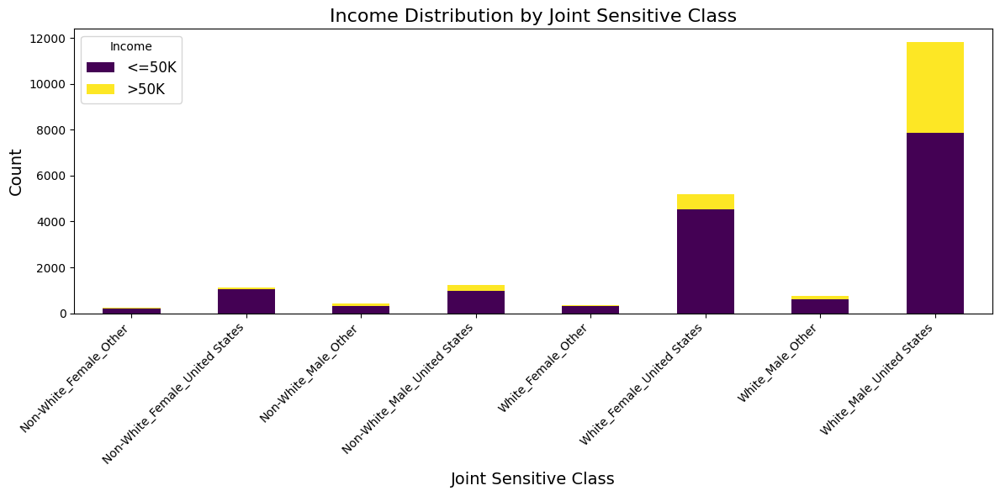

In [191]:
# Group the data by sensitive class and income
distribution_data = (
    trainset.groupby(["joint_sensitive_class", "income"])
    .size()
    .unstack(fill_value=0)
)

# Plot the stacked bar chart
ax = distribution_data.plot(kind="bar", stacked=True, figsize=(12, 6), colormap="viridis")
plt.title("Income Distribution by Joint Sensitive Class", fontsize=16)
plt.xlabel("Joint Sensitive Class", fontsize=14)
plt.ylabel("Count", fontsize=14)
plt.xticks(rotation=45, ha="right")
plt.legend(["<=50K", ">50K"], title="Income", fontsize=12)
plt.tight_layout()
plt.show()

## Oversampling with ADASYN

In [192]:
from imblearn.over_sampling import ADASYN

adasyn = ADASYN(sampling_strategy="minority", random_state=42)
X_resampled, y_resampled = adasyn.fit_resample(trainset.drop(columns=['joint_sensitive_class', 'income', 'composite_target']), trainset['composite_target'])

# Validate new distributions
print("New class distribution:")
print(pd.Series(y_resampled).value_counts())

New class distribution:
composite_target
Non-White_Female_Other_true             7869
White_Male_United States_false          7867
White_Female_United States_false        4524
White_Male_United States_true           3937
Non-White_Female_United States_false    1038
Non-White_Male_United States_false       987
White_Female_United States_true          666
White_Male_Other_false                   615
White_Female_Other_false                 320
Non-White_Male_Other_false               300
Non-White_Male_United States_true        241
Non-White_Female_Other_false             206
White_Male_Other_true                    157
Non-White_Male_Other_true                133
Non-White_Female_United States_true       67
White_Female_Other_true                   31
Name: count, dtype: int64


In [193]:
print("Pre oversampling: \n")
print(pd.Series(X_train["race_mapped_White"].value_counts()))
print("\nPost oversampling: \n")
print(pd.Series(X_resampled["race_mapped_White"].value_counts()))

Pre oversampling: 

race_mapped_White
1.0    18117
0.0     2996
Name: count, dtype: int64

Post oversampling: 

race_mapped_White
1.0    18117
0.0    10841
Name: count, dtype: int64


In [194]:
print("Pre oversampling: \n")
print(pd.Series(X_train["region_United States"].value_counts()))
print("\nPost oversampling: \n")
print(pd.Series(X_resampled["region_United States"].value_counts()))

Pre oversampling: 

region_United States
1.0    19327
0.0     1786
Name: count, dtype: int64

Post oversampling: 

region_United States
1.0    19327
0.0     9631
Name: count, dtype: int64


In [195]:
print("Pre oversampling: \n")
print(pd.Series(X_train["sex_Male"].value_counts()))
print("\nPost oversampling: \n")
print(pd.Series(X_resampled["sex_Male"].value_counts()))

Pre oversampling: 

sex_Male
1.0    14237
0.0     6876
Name: count, dtype: int64

Post oversampling: 

sex_Male
0.0    14721
1.0    14237
Name: count, dtype: int64


In [196]:
print("Pre oversampling: \n")
print(pd.Series(y_train.value_counts()))
print("\nPost oversampling: \n")
print(pd.Series(X_resampled["income_>50K"].value_counts()))

Pre oversampling: 

income_>50K
0.0    15857
1.0     5256
Name: count, dtype: int64

Post oversampling: 

income_>50K
0.0    15857
1.0    13101
Name: count, dtype: int64


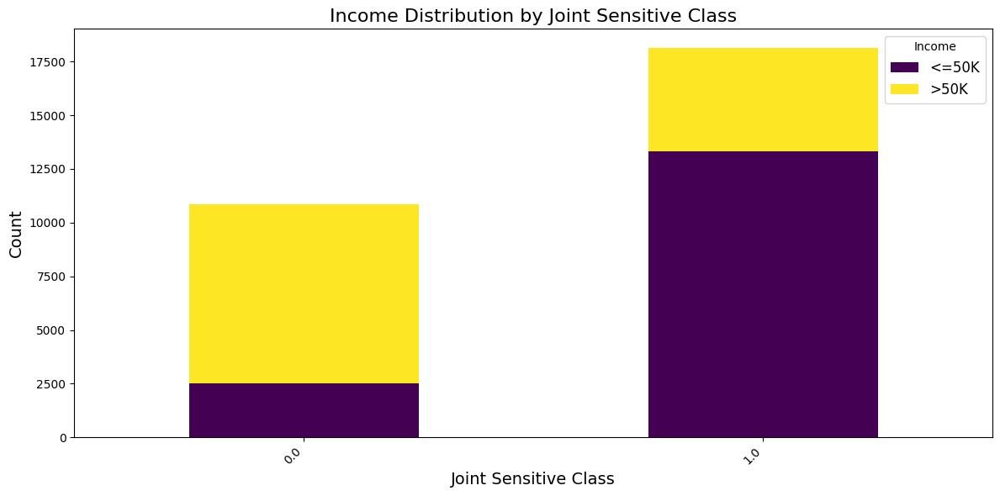

In [197]:
# Group the data by sensitive class and income
distribution_data = (
    X_resampled.groupby(["race_mapped_White", "income_>50K"])
    .size()
    .unstack(fill_value=0)
)

# Plot the stacked bar chart
ax = distribution_data.plot(kind="bar", stacked=True, figsize=(12, 6), colormap="viridis")
plt.title("Income Distribution by Joint Sensitive Class", fontsize=16)
plt.xlabel("Joint Sensitive Class", fontsize=14)
plt.ylabel("Count", fontsize=14)
plt.xticks(rotation=45, ha="right")
plt.legend(["<=50K", ">50K"], title="Income", fontsize=12)
plt.tight_layout()
plt.show()

## Preparing for the postcolumns 

In [199]:
columns = X_test.columns

In [200]:
X_train_final = X_resampled[columns]

In [201]:
y_train_final = X_resampled['income_>50K']

In [202]:
from xgboost import XGBClassifier
from sklearn.metrics import classification_report, accuracy_score
import numpy as np

# Initialize the XGBoost classifier
xgb_model = XGBClassifier(
    eval_metric="logloss",    # Set evaluation metric
    random_state=42,
    n_estimators=100,         # Number of boosting rounds
    learning_rate=0.1,        # Step size shrinkage
    max_depth=6,              # Maximum depth of trees
    subsample=0.8,            # Fraction of samples used for training
    colsample_bytree=0.8      # Fraction of features used for training
)

# Train the model on the oversampled training set
xgb_model.fit(X_train_final, y_train_final)

# Test the model
y_pred_test = xgb_model.predict(X_test)

# Evaluate performance
print("Classification Report (Test Set):")
print(classification_report(y_test, y_pred_test))
print("Accuracy (Test Set):", accuracy_score(y_test, y_pred_test))


Classification Report (Test Set):
              precision    recall  f1-score   support

         0.0       0.87      0.92      0.89      6797
         1.0       0.71      0.59      0.64      2252

    accuracy                           0.84      9049
   macro avg       0.79      0.75      0.77      9049
weighted avg       0.83      0.84      0.83      9049

Accuracy (Test Set): 0.8366670350314952


## Calculating selection rate (ratio of entries predicted as true/predicted as false) and other fairness metrics

In [203]:
def calculate_selection_rate(y_pred, sensitive_features, group_value):
    # Filter for the specific group
    group_mask = sensitive_features == group_value
    group_size = group_mask.sum()  # Total number of individuals in the group
    positive_predictions = (y_pred[group_mask] == 1).sum()  # Positive predictions for the group
    
    # Calculate selection rate
    return positive_predictions / group_size if group_size > 0 else 0


In [204]:
sensitive_groups = X_test["sex_Male"].unique()  # Example for sex-sensitive attribute
for group in sensitive_groups:
    selection_rate = calculate_selection_rate(y_pred_pre, X_test["sex_Male"], group)
    print(f"Selection Rate Pre ADASYN (Sex = {group}): {selection_rate:.4f}")
for group in sensitive_groups:
    selection_rate = calculate_selection_rate(y_pred_test, X_test["sex_Male"], group)
    print(f"Selection Rate Post ADASYN (Sex = {group}): {selection_rate:.4f}")

print("-"*50)
sensitive_groups = X_test["race_mapped_White"].unique()  # Example for sex-sensitive attribute
for group in sensitive_groups:
    selection_rate = calculate_selection_rate(y_pred_pre, X_test["race_mapped_White"], group)
    print(f"Selection Rate Pre ADASYN(race = {group}): {selection_rate:.4f}")
for group in sensitive_groups:
    selection_rate = calculate_selection_rate(y_pred_test, X_test["race_mapped_White"], group)
    print(f"Selection Rate Post ADASYN (race = {group}): {selection_rate:.4f}")
print("-"*50)
sensitive_groups = X_test["region_United States"].unique()  # Example for sex-sensitive attribute
for group in sensitive_groups:
    selection_rate = calculate_selection_rate(y_pred_pre, X_test["region_United States"], group)
    print(f"Selection Rate Pre ADASYN (region = {group}): {selection_rate:.4f}")
for group in sensitive_groups:
    selection_rate = calculate_selection_rate(y_pred_test, X_test["region_United States"], group)
    print(f"Selection Rate Post ADASYN (region = {group}): {selection_rate:.4f}")


Selection Rate Pre ADASYN (Sex = 1.0): 0.2587
Selection Rate Pre ADASYN (Sex = 0.0): 0.0881
Selection Rate Post ADASYN (Sex = 1.0): 0.2569
Selection Rate Post ADASYN (Sex = 0.0): 0.0998
--------------------------------------------------
Selection Rate Pre ADASYN(race = 1.0): 0.2188
Selection Rate Pre ADASYN(race = 0.0): 0.1095
Selection Rate Post ADASYN (race = 1.0): 0.2180
Selection Rate Post ADASYN (race = 0.0): 0.1330
--------------------------------------------------
Selection Rate Pre ADASYN (region = 0.0): 0.1399
Selection Rate Pre ADASYN (region = 1.0): 0.2098
Selection Rate Post ADASYN (region = 0.0): 0.1830
Selection Rate Post ADASYN (region = 1.0): 0.2086


In [205]:
from fairlearn.metrics import MetricFrame, demographic_parity_difference, equalized_odds_difference

# Define sensitive features
race = X_test["race_mapped_White"]
region = X_test["region_United States"]
sex = X_test["sex_Male"]
# Evaluate performance by sensitive groups
mf = MetricFrame(
    metrics={"Accuracy": accuracy_score},
    y_true=y_test,
    y_pred=y_pred_test,
    sensitive_features=sex
)
mf2 = MetricFrame(
    metrics={"Accuracy": accuracy_score},
    y_true=y_test,
    y_pred=y_pred_test,
    sensitive_features=race
)
mf3 = MetricFrame(
    metrics={"Accuracy": accuracy_score},
    y_true=y_test,
    y_pred=y_pred_test,
    sensitive_features=region
)

# Print metrics by group
print("\nPerformance by Sensitive Group (sex):")
print(mf.by_group)

# Fairness metrics
dp_diff = demographic_parity_difference(y_test, y_pred_test, sensitive_features=sex)
eod_diff = equalized_odds_difference(y_test, y_pred_test, sensitive_features=sex)
print(f"Demographic Parity Difference: {dp_diff:.4f}")
print(f"Equalized Odds Difference: {eod_diff:.4f}")
print("\nPerformance by Sensitive Group (race):")
print(mf2.by_group)
# Fairness metrics
dp_diff2 = demographic_parity_difference(y_test, y_pred_test, sensitive_features=race)
eod_diff2 = equalized_odds_difference(y_test, y_pred_test, sensitive_features=race)
print(f"Demographic Parity Difference: {dp_diff:.4f}")
print(f"Equalized Odds Difference: {eod_diff:.4f}")
print("\nPerformance by Sensitive Group (region):")
print(mf3.by_group)

# Fairness metrics
dp_diff3 = demographic_parity_difference(y_test, y_pred_test, sensitive_features=region)
eod_diff3 = equalized_odds_difference(y_test, y_pred_test, sensitive_features=region)

print(f"Demographic Parity Difference: {dp_diff3:.4f}")
print(f"Equalized Odds Difference: {eod_diff3:.4f}")


Performance by Sensitive Group (sex):
          Accuracy
sex_Male          
0.0       0.904336
1.0       0.804656
Demographic Parity Difference: 0.1571
Equalized Odds Difference: 0.0795

Performance by Sensitive Group (race):
                   Accuracy
race_mapped_White          
0.0                0.863747
1.0                0.832395
Demographic Parity Difference: 0.1571
Equalized Odds Difference: 0.0795

Performance by Sensitive Group (region):
                      Accuracy
region_United States          
0.0                   0.858824
1.0                   0.834621
Demographic Parity Difference: 0.0256
Equalized Odds Difference: 0.0368


In [206]:
from sklearn.metrics import confusion_matrix

# Function to calculate Disparate Impact
def calculate_disparate_impact(y_true, y_pred, sensitive_features, privileged_group, positive_outcome=1):
    privileged_mask = sensitive_features == privileged_group
    unprivileged_mask = ~privileged_mask

    privileged_positive_rate = (y_pred[privileged_mask] == positive_outcome).mean()
    unprivileged_positive_rate = (y_pred[unprivileged_mask] == positive_outcome).mean()

    if privileged_positive_rate == 0:  # Prevent division by zero
        return None
    return unprivileged_positive_rate / privileged_positive_rate

# Calculate Disparate Impact for each sensitive feature
di_sex = calculate_disparate_impact(y_test, y_pred_test, X_test["sex_Male"], privileged_group=1)
di_race = calculate_disparate_impact(y_test, y_pred_test, X_test["race_mapped_White"], privileged_group=1)
di_region = calculate_disparate_impact(y_test, y_pred_test, X_test["region_United States"], privileged_group=1)

print("Disparate Impact (Sex):", di_sex)
print("Disparate Impact (Race):", di_race)
print("Disparate Impact (Region):", di_region)


Disparate Impact (Sex): 0.3884864756890381
Disparate Impact (Race): 0.610092564035198
Disparate Impact (Region): 0.8773299443234083


In [207]:
# Function to display confusion matrix by group
def confusion_matrix_by_group(y_true, y_pred, sensitive_features, group_value):
    group_mask = sensitive_features == group_value
    return confusion_matrix(y_true[group_mask], y_pred[group_mask])

# Confusion Matrices for each sensitive feature
print("Confusion Matrix (Sex = Male):")
print(confusion_matrix_by_group(y_test, y_pred_test, X_test["sex_Male"], group_value=1))

print("\nConfusion Matrix (Sex = Female):")
print(confusion_matrix_by_group(y_test, y_pred_test, X_test["sex_Male"], group_value=0))

print("\nConfusion Matrix (Race = White):")
print(confusion_matrix_by_group(y_test, y_pred_test, X_test["race_mapped_White"], group_value=1))

print("\nConfusion Matrix (Race = Non-White):")
print(confusion_matrix_by_group(y_test, y_pred_test, X_test["race_mapped_White"], group_value=0))

print("\nConfusion Matrix (Region = United States):")
print(confusion_matrix_by_group(y_test, y_pred_test, X_test["region_United States"], group_value=1))

print("\nConfusion Matrix (Region = Other):")
print(confusion_matrix_by_group(y_test, y_pred_test, X_test["region_United States"], group_value=0))


Confusion Matrix (Sex = Male):
[[3790  425]
 [ 775 1153]]

Confusion Matrix (Sex = Female):
[[2460  122]
 [ 156  168]]

Confusion Matrix (Race = White):
[[5285  483]
 [ 827 1221]]

Confusion Matrix (Race = Non-White):
[[965  64]
 [104 100]]

Confusion Matrix (Region = United States):
[[5675  489]
 [ 881 1239]]

Confusion Matrix (Region = Other):
[[575  58]
 [ 50  82]]


In [208]:
# Function to calculate TPR by group
from sklearn.metrics import recall_score

def tpr_by_group(y_true, y_pred, sensitive_features, group_value):
    group_mask = sensitive_features == group_value
    return recall_score(y_true[group_mask], y_pred[group_mask])

# TPR for each sensitive feature
print("True Positive Rate (Sex = Male):", tpr_by_group(y_test, y_pred_test, X_test["sex_Male"], group_value=1))
print("True Positive Rate (Sex = Female):", tpr_by_group(y_test, y_pred_test, X_test["sex_Male"], group_value=0))

print("True Positive Rate (Race = White):", tpr_by_group(y_test, y_pred_test, X_test["race_mapped_White"], group_value=1))
print("True Positive Rate (Race = Non-White):", tpr_by_group(y_test, y_pred_test, X_test["race_mapped_White"], group_value=0))

print("True Positive Rate (Region = United States):", tpr_by_group(y_test, y_pred_test, X_test["region_United States"], group_value=1))
print("True Positive Rate (Region = Other):", tpr_by_group(y_test, y_pred_test, X_test["region_United States"], group_value=0))


True Positive Rate (Sex = Male): 0.5980290456431535
True Positive Rate (Sex = Female): 0.5185185185185185
True Positive Rate (Race = White): 0.59619140625
True Positive Rate (Race = Non-White): 0.49019607843137253
True Positive Rate (Region = United States): 0.5844339622641509
True Positive Rate (Region = Other): 0.6212121212121212


### Analysis of metrics
The application of ADASYN demonstrated a focused attempt to reduce bias across sensitive groups while striving to maintain overall model performance. By dynamically generating synthetic samples for underrepresented groups, ADASYN ensured a more balanced representation in the training data.

The tradeoff between fairness and performance underscores the effectiveness of ADASYN in achieving a more equitable model without heavily compromising its predictive capabilities (moving the accuracy from 83.92% pre-ADASYN to 83.67% post-ADASYN). This approach highlights the importance of balancing fairness objectives with performance requirements in practical machine learning applications.

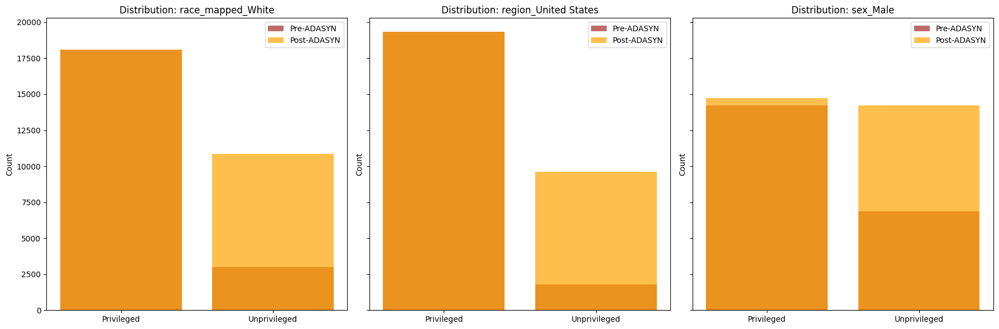

In [209]:
# Pre and post oversampling distributions
pre_oversampling = {'race_mapped_White': [18117, 2996], 'region_United States': [19327, 1786], 'sex_Male': [14237, 6876]}
post_oversampling = {'race_mapped_White': [18117, 10840], 'region_United States': [19327, 9630], 'sex_Male': [14720, 14237]}

# Convert to DataFrame for easier plotting
pre_df = pd.DataFrame(pre_oversampling, index=['Privileged', 'Unprivileged'])
post_df = pd.DataFrame(post_oversampling, index=['Privileged', 'Unprivileged'])

# Plotting
fig, axs = plt.subplots(1, 3, figsize=(18, 6), sharey=True)
for i, feature in enumerate(pre_oversampling.keys()):
    axs[i].bar(pre_df.index, pre_df[feature], alpha=0.7, label='Pre-ADASYN', color='brown')
    axs[i].bar(post_df.index, post_df[feature], alpha=0.7, label='Post-ADASYN', color='orange')
    axs[i].set_title(f'Distribution: {feature}', fontsize=12)
    axs[i].set_ylabel('Count', fontsize=10)
    axs[i].legend()

plt.tight_layout()
plt.show()

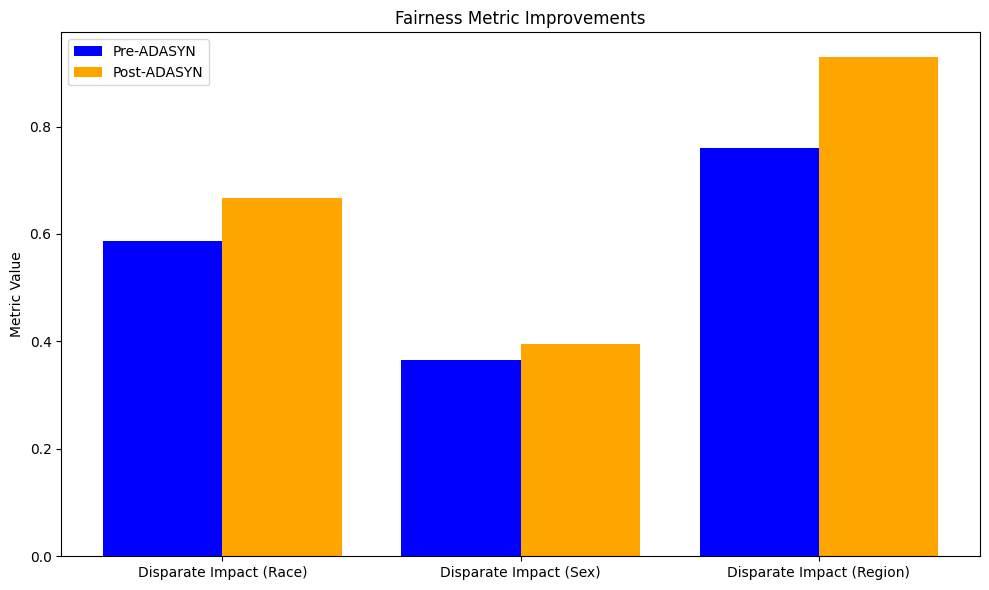

In [210]:
# Fairness metrics before and after
metrics = ['Disparate Impact (Race)', 'Disparate Impact (Sex)', 'Disparate Impact (Region)']
pre_metrics = [0.5869, 0.3652, 0.7602]
post_metrics = [0.6673, 0.3951, 0.9289]

x = np.arange(len(metrics))

fig, ax = plt.subplots(figsize=(10, 6))
ax.bar(x - 0.2, pre_metrics, width=0.4, label='Pre-ADASYN', color='blue')
ax.bar(x + 0.2, post_metrics, width=0.4, label='Post-ADASYN', color='orange')

ax.set_xticks(x)
ax.set_xticklabels(metrics)
ax.set_ylabel('Metric Value')
ax.set_title('Fairness Metric Improvements')
ax.legend()

plt.tight_layout()
plt.show()